# 🌿 RaithaMitra — Crop Disease Detection (Production Notebook v3)
### EfficientNet-B0 | Two-Phase Transfer Learning | Class-Weighted Training | Macro-F1 Evaluation | Grad-CAM Explainability | TFLite Export

**Project:** RaithaMitra — Kannada-first Agricultural AI Assistant
**Component:** Crop Disease Detection Module (Computer Vision)
**Base architecture:** EfficientNet-B0 (ImageNet pretrained, two-phase fine-tuning)
**Dataset layout (already prepared — DO NOT reshuffle):**

```
major project/
    dataset/
        train/
            class_1/
            class_2/
            ...
        val/
            class_1/
            class_2/
            ...
```

---

### Engineering lineage of this notebook

This notebook is a from-scratch rewrite that combines two prior notebooks:

| Source | What was kept |
|---|---|
| **RaithaMitra EfficientNetB0 (primary reference)** | Dataset reading from pre-split `train/`/`val/` folders, `tf.data` pipeline, overall modular structure, Grad-CAM design, evaluation approach |
| **plant_disease_v2_robust (secondary reference)** | Class-weighted loss, Macro-F1 monitoring, confidence-thresholded inference, richer callback strategy, TFLite export, deployment-oriented evaluation |

Explicitly **not** carried over from the secondary reference: `validation_split`,
single-folder dataset assumptions, and any augmentation/pipeline choices that would
reshuffle or resplit the existing `train`/`val` folders. Your existing split is
treated as ground truth throughout.

Every cell below is self-contained, runs top-to-bottom without manual fixes, and
explains *why* a decision was made, not just *what* it does.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## CELL 0 — Environment Setup

**Purpose.** Establish a fully reproducible execution environment before any
dataset or model code runs. This is the single most commonly skipped step in
student ML notebooks, and it is the reason results are often unreproducible
between Colab sessions.

**What this cell does and why:**
- Pins dependency versions where it matters (TensorFlow's dataset/augmentation
  APIs shift between minor versions).
- Prints GPU availability up front — training EfficientNet-B0 on CPU is
  technically possible but prohibitively slow, so we want the mismatch to be
  obvious immediately rather than discovered 40 minutes into Phase 1.
- Sets **all** random seeds (Python, NumPy, TensorFlow) — reproducibility
  requires all three, not just one.
- Records environment metadata (TF version, Keras version, Python version,
  GPU model) into a dict that is saved alongside the run outputs later, so a
  future reader of `outputs/<run>/environment.json` knows exactly what produced
  a given model.


In [28]:
# ── CELL 0: Environment Setup ────────────────────────────────────────────────
import os, sys, json, random, warnings, platform, subprocess
warnings.filterwarnings("ignore")

import numpy as np
import tensorflow as tf

# ── Reproducibility: seed every source of randomness ─────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

# ── Environment info ──────────────────────────────────────────────────────────
gpu_devices = tf.config.list_physical_devices("GPU")
try:
    gpu_name = subprocess.check_output(
        ["nvidia-smi", "--query-gpu=name", "--format=csv,noheader"]
    ).decode().strip()
except Exception:
    gpu_name = "N/A (no nvidia-smi / no GPU)"

ENV_INFO = {
    "tensorflow_version": tf.__version__,
    "keras_version": tf.keras.__version__,
    "python_version": platform.python_version(),
    "platform": platform.platform(),
    "gpu_available": len(gpu_devices) > 0,
    "gpu_devices": [str(d) for d in gpu_devices],
    "gpu_name": gpu_name,
    "seed": SEED,
}

print("=" * 60)
print(" ENVIRONMENT SUMMARY")
print("=" * 60)
for k, v in ENV_INFO.items():
    print(f"  {k:20s}: {v}")
print("=" * 60)

if not ENV_INFO["gpu_available"]:
    print("\n⚠️  WARNING: No GPU detected. EfficientNet-B0 training will be")
    print("   extremely slow on CPU. In Colab: Runtime → Change runtime type")
    print("   → Hardware accelerator → GPU (T4).")
else:
    print(f"\n✅ GPU detected: {gpu_name}")

# Mixed precision is intentionally NOT enabled by default: EfficientNet's
# Squeeze-and-Excitation blocks combined with BatchNorm can be numerically
# fragile under float16 without careful loss scaling. We keep float32 for
# correctness and predictability; mixed precision is a valid future optimization.


 ENVIRONMENT SUMMARY
  tensorflow_version  : 2.20.0
  keras_version       : 3.13.2
  python_version      : 3.12.13
  platform            : Linux-6.6.122+-x86_64-with-glibc2.35
  gpu_available       : False
  gpu_devices         : []
  gpu_name            : N/A (no nvidia-smi / no GPU)
  seed                : 42

⚠️  WARNING: No GPU detected. EfficientNet-B0 training will be
   extremely slow on CPU. In Colab: Runtime → Change runtime type
   → Hardware accelerator → GPU (T4).


## CELL 1 — Dataset Configuration & Structural Validation

**Purpose.** Fail fast and loud if the dataset is not exactly what the rest of
the notebook assumes. Silent dataset problems (a missing class folder, an
empty split) are the single biggest source of wasted GPU-hours in student
projects — a 40-minute Phase-1 run that quietly trained on 19 classes instead
of 21 is worse than a training run that never started.

**What this cell enforces:**
- `DATA_DIR/train` and `DATA_DIR/val` must both exist.
- Every class present in `train` must also be present in `val`, and vice versa
  — a class folder that exists only on one side silently breaks
  `class_indices` alignment during evaluation.
- No class folder may be empty.
- Execution **stops** (`assert`) on any violation, with a message that names
  exactly which class/folder is the problem — no guessing.

**Design choice — why we don't use `validation_split`:** Your dataset is
already split into `train/` and `val/` folders by a prior data-preparation
step. Re-splitting via `validation_split` would silently discard that curation
work and could leak near-duplicate images (common in agricultural datasets
with multiple photos of the same leaf) across the split boundary. We read the
two folders directly and never merge or reshuffle them.


In [29]:
# ── CELL 1: Dataset Configuration & Validation ───────────────────────────────
from pathlib import Path

# ── Configuration — edit this block only ─────────────────────────────────────
CONFIG = {
    "DATA_DIR":     "/content/drive/MyDrive/major project dataset",
    "IMG_SIZE":     224,
    "BATCH_SIZE":   32,

    # Phase 1 (frozen backbone) — classifier head only
    "PHASE1_EPOCHS": 15,
    "PHASE1_LR":     1e-3,

    # Phase 2 (fine-tuning) — unfreeze upper MBConv blocks
    "PHASE2_EPOCHS":   25,
    "PHASE2_LR":       1e-5,
    "FINE_TUNE_LAYERS": 20,     # unfreeze the last N layers of the base model

    # Deployment
    "CONFIDENCE_THRESHOLD": 0.55,

    "SEED": SEED,
}

DATA_DIR  = Path(CONFIG["DATA_DIR"])
TRAIN_DIR = DATA_DIR / "train"
VAL_DIR   = DATA_DIR / "val"

VALID_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".tiff")

def list_class_dirs(split_dir: Path):
    if not split_dir.exists():
        return {}
    return {d.name: d for d in sorted(split_dir.iterdir()) if d.is_dir()}

# ── Step 1: top-level folders must exist ──────────────────────────────────────
assert DATA_DIR.exists(),  f"❌ DATA_DIR not found: {DATA_DIR}"
assert TRAIN_DIR.exists(), f"❌ train/ folder not found inside {DATA_DIR}"
assert VAL_DIR.exists(),   f"❌ val/ folder not found inside {DATA_DIR}"

train_classes = list_class_dirs(TRAIN_DIR)
val_classes   = list_class_dirs(VAL_DIR)

# ── Step 2: class-set symmetry check ─────────────────────────────────────────
train_only = sorted(set(train_classes) - set(val_classes))
val_only   = sorted(set(val_classes) - set(train_classes))

if train_only:
    print(f"❌ Classes present in train/ but MISSING from val/: {train_only}")
if val_only:
    print(f"❌ Classes present in val/ but MISSING from train/: {val_only}")
assert not train_only and not val_only, (
    "❌ Dataset validation FAILED — class folders are not symmetric between "
    "train/ and val/. Fix the dataset before proceeding. Execution stopped."
)

# ── Step 3: no empty class folders ────────────────────────────────────────────
empty_classes = []
for name, d in {**train_classes, **val_classes}.items():
    for split_dir in (train_classes.get(name), val_classes.get(name)):
        if split_dir is None:
            continue
        n_imgs = sum(1 for f in split_dir.iterdir() if f.suffix.lower() in VALID_EXTS)
        if n_imgs == 0:
            empty_classes.append(str(split_dir))

assert not empty_classes, (
    f"❌ Dataset validation FAILED — empty class folders found: {empty_classes}. "
    "Execution stopped."
)

CLASS_NAMES = sorted(train_classes.keys())
NUM_CLASSES = len(CLASS_NAMES)

print("✅ Dataset structure validated successfully.")
print(f"   Data directory : {DATA_DIR}")
print(f"   Classes found  : {NUM_CLASSES}")
print(f"   train/ and val/ contain an identical, non-empty set of class folders.")


✅ Dataset structure validated successfully.
   Data directory : /content/drive/MyDrive/major project dataset
   Classes found  : 21
   train/ and val/ contain an identical, non-empty set of class folders.


## CELL 2 — Dataset Cleaning (Corrupted & Duplicate Images)

**Purpose.** `tf.keras.utils.image_dataset_from_directory` will crash mid-epoch
on a single truncated JPEG — usually after 20+ minutes of training, which is
the worst possible time to discover it. We check every file up front instead.

**Corrupted-image detection:** `PIL.Image.verify()` parses the file header and
raises on truncation or malformed encoding, without decoding full pixel data
(fast).

**Duplicate-image detection:** MD5 checksum of raw file bytes. Exact duplicates
(common when a dataset is assembled from multiple overlapping sources) inflate
the apparent size of a class and can leak identical images across `train`/`val`
if a duplicate happens to exist on both sides — we deliberately check **within
each split only**, never across `train` and `val`, since cross-split duplicate
removal is a different (stricter) problem and is reported separately below for
visibility rather than silently altering your split.

**Safety note:** corrupted-image removal is destructive (files are deleted).
Duplicate removal is also destructive. Both operations only ever touch files
already inside `train/` or `val/` — nothing is copied or moved between splits.


In [30]:
# ── CELL 2: Dataset Cleaning ──────────────────────────────────────────────────
import hashlib
from PIL import Image

def find_corrupted_images(directory: Path):
    corrupted = []
    for fpath in directory.rglob("*"):
        if fpath.suffix.lower() not in VALID_EXTS:
            continue
        try:
            with Image.open(fpath) as img:
                img.verify()
        except Exception:
            corrupted.append(fpath)
    return corrupted

def find_duplicate_images(directory: Path):
    '''MD5-based exact-duplicate detection, scoped to `directory` only.'''
    seen_hashes = {}
    duplicates = []
    for fpath in sorted(directory.rglob("*")):
        if fpath.suffix.lower() not in VALID_EXTS:
            continue
        file_hash = hashlib.md5(fpath.read_bytes()).hexdigest()
        if file_hash in seen_hashes:
            duplicates.append(fpath)
        else:
            seen_hashes[file_hash] = fpath
    return duplicates

print("🔍 Scanning for corrupted images...")
corrupted_train = find_corrupted_images(TRAIN_DIR)
corrupted_val   = find_corrupted_images(VAL_DIR)

for f in corrupted_train + corrupted_val:
    f.unlink()

print(f"   Removed corrupted — train: {len(corrupted_train)}, val: {len(corrupted_val)}")

print("🔍 Scanning for exact duplicate images (within-split only)...")
dupes_train = find_duplicate_images(TRAIN_DIR)
dupes_val   = find_duplicate_images(VAL_DIR)

for f in dupes_train + dupes_val:
    f.unlink()

print(f"   Removed duplicates — train: {len(dupes_train)}, val: {len(dupes_val)}")

# ── Post-cleaning summary ─────────────────────────────────────────────────────
def count_all_images(directory: Path):
    return sum(1 for f in directory.rglob("*") if f.suffix.lower() in VALID_EXTS)

n_train_final = count_all_images(TRAIN_DIR)
n_val_final   = count_all_images(VAL_DIR)

print("\n" + "=" * 50)
print(" CELL 2 SUMMARY — Dataset Cleaning")
print("=" * 50)
print(f"  Images removed (corrupted) : {len(corrupted_train) + len(corrupted_val)}")
print(f"  Images removed (duplicate) : {len(dupes_train) + len(dupes_val)}")
print(f"  Final train image count    : {n_train_final:,}")
print(f"  Final val image count      : {n_val_final:,}")
print("=" * 50)


🔍 Scanning for corrupted images...
   Removed corrupted — train: 0, val: 0
🔍 Scanning for exact duplicate images (within-split only)...
   Removed duplicates — train: 0, val: 0

 CELL 2 SUMMARY — Dataset Cleaning
  Images removed (corrupted) : 0
  Images removed (duplicate) : 0
  Final train image count    : 22,572
  Final val image count      : 5,645


## CELL 3 — Dataset Statistics & Class Distribution

**Purpose.** Before choosing a training strategy, we need to know the shape of
the data: how imbalanced it is, and how the imbalance interacts with the
train/val split. This directly informs two later decisions — class-weighted
loss (CELL 5) and which evaluation metric to trust (Macro-F1 over accuracy, in
CELL 10).

**Why we compute the imbalance ratio explicitly:** a ratio like 25× (as seen
in this dataset — compare `Tomato_Yellow_Leaf_Curl_Virus` against
`Potato_healthy`) means plain accuracy can look excellent (>90%) while the
model has effectively learned to ignore the minority classes. Standard
cross-entropy loss will not warn you about this; only a per-class metric will.


Class                                               Train      Val    Total
----------------------------------------------------------------------------
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot      410      103      513
Corn_(maize)___Common_rust_                           953      239     1192
Corn_(maize)___Northern_Leaf_Blight                   788      197      985
Corn_(maize)___healthy                                929      233     1162
Grape___Black_rot                                     944      236     1180
Grape___Esca_(Black_Measles)                         1107      276     1383
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)            861      215     1076
Grape___healthy                                       339       84      423
Potato___Early_blight                                 800      200     1000
Potato___Late_blight                                  800      200     1000
Potato___healthy                                      121       31      152
Tomato___

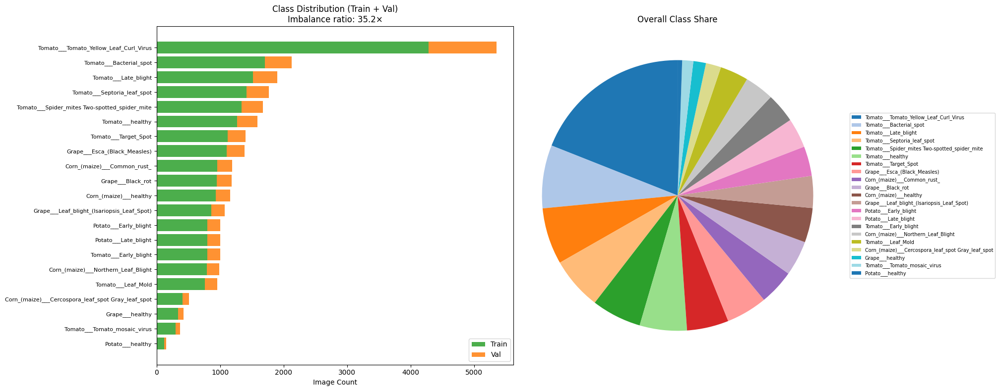


✅ CELL 3 complete — dataset summary computed and stored in DATASET_SUMMARY.


In [31]:
# ── CELL 3: Dataset Statistics ────────────────────────────────────────────────
import matplotlib.pyplot as plt

def count_images_per_class(directory: Path, class_names):
    counts = {}
    for cls in class_names:
        cls_dir = directory / cls
        counts[cls] = sum(1 for f in cls_dir.iterdir() if f.suffix.lower() in VALID_EXTS) if cls_dir.exists() else 0
    return counts

train_counts = count_images_per_class(TRAIN_DIR, CLASS_NAMES)
val_counts   = count_images_per_class(VAL_DIR, CLASS_NAMES)
total_counts = {c: train_counts[c] + val_counts[c] for c in CLASS_NAMES}

total_train = sum(train_counts.values())
total_val   = sum(val_counts.values())
total_all   = total_train + total_val

print(f"{'Class':<48} {'Train':>8} {'Val':>8} {'Total':>8}")
print("-" * 76)
for c in CLASS_NAMES:
    print(f"{c:<48} {train_counts[c]:>8} {val_counts[c]:>8} {total_counts[c]:>8}")
print("-" * 76)
print(f"{'TOTAL':<48} {total_train:>8} {total_val:>8} {total_all:>8}")
print(f"\nActual split ratio — train: {total_train/total_all:.1%} | val: {total_val/total_all:.1%}")

max_count = max(total_counts.values())
min_count = min(total_counts.values())
imbalance_ratio = max_count / min_count
print(f"\nClass imbalance ratio (max/min): {imbalance_ratio:.1f}×")
minority_classes = {c: n for c, n in total_counts.items() if n < 0.3 * max_count}
if minority_classes:
    print("Minority classes (<30% of the largest class):")
    for c, n in sorted(minority_classes.items(), key=lambda x: x[1]):
        print(f"   {c:<48} → {n} images")

# ── Visualization: bar chart (train vs val) + pie chart (overall share) ──────
sorted_items = sorted(total_counts.items(), key=lambda x: x[1], reverse=True)
names_sorted = [n for n, _ in sorted_items]

fig = plt.figure(figsize=(20, 8))
ax1 = fig.add_subplot(1, 2, 1)
y_pos = np.arange(len(names_sorted))
ax1.barh(y_pos, [train_counts[n] for n in names_sorted], label="Train", color="#2ca02c", alpha=0.85)
ax1.barh(y_pos, [val_counts[n] for n in names_sorted],
         left=[train_counts[n] for n in names_sorted], label="Val", color="#ff7f0e", alpha=0.85)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(names_sorted, fontsize=8)
ax1.invert_yaxis()
ax1.set_xlabel("Image Count")
ax1.set_title(f"Class Distribution (Train + Val)\nImbalance ratio: {imbalance_ratio:.1f}×")
ax1.legend()

ax2 = fig.add_subplot(1, 2, 2)
ax2.pie([total_counts[n] for n in names_sorted], labels=None, autopct=None, startangle=90,
        colors=plt.cm.tab20.colors)
ax2.set_title("Overall Class Share")
ax2.legend(names_sorted, loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=7, ncol=1)

plt.tight_layout()
os.makedirs("/content/plots", exist_ok=True)
plt.savefig("/content/plots/class_distribution.png", dpi=130, bbox_inches="tight")
plt.show()

DATASET_SUMMARY = {
    "num_classes": NUM_CLASSES,
    "total_train": total_train,
    "total_val": total_val,
    "imbalance_ratio": imbalance_ratio,
    "train_counts": train_counts,
    "val_counts": val_counts,
}
print("\n✅ CELL 3 complete — dataset summary computed and stored in DATASET_SUMMARY.")


## CELL 4 — `tf.data` Pipeline & Train-Only Augmentation

**Purpose.** Build efficient, leak-free input pipelines and apply augmentation
**only** to the training stream.

**Why `tf.data` + `image_dataset_from_directory` instead of `ImageDataGenerator`:**
`ImageDataGenerator` is in maintenance mode and CPU-bound. `image_dataset_from_directory`
combined with a `tf.data` pipeline (`.map(..., num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)`)
lets augmentation run as part of the graph (GPU-eligible) and overlaps data
loading with GPU compute — meaningfully faster on Colab's T4.

**Why augmentation is a `tf.keras.Sequential` of preprocessing layers, applied
only inside `train_ds.map(...)`:** this guarantees, structurally, that
`val_ds` can never accidentally receive augmented images — a common and hard-to-spot
bug when augmentation lives inside a shared generator config. Augmentation never
changes the number of images or the train/val ratio; it transforms each batch
on the fly, every epoch, so the *effective* training distribution grows without
the *stored* dataset size changing.

**Augmentation choices and their justification** (synthesizing both reference
notebooks — geometric transforms from RaithaMitra's approach, photometric
range choices informed by the domain-shift reasoning in the secondary
reference, since farmers' field photos vary far more in lighting than studio
PlantVillage-style captures do):

| Augmentation | Real-world justification |
|---|---|
| Horizontal + vertical flip | No canonical leaf orientation in the field |
| Rotation (±20%) | Farmers photograph leaves at arbitrary angles |
| Zoom (±15%) | Variable camera distance |
| Translation (±10%) | Off-center framing is the norm, not the exception |
| Brightness (±20%) | Outdoor sunlight/shade variance |
| Contrast (±20%) | Camera auto-exposure varies shot to shot |

We deliberately avoid extreme rotation/shear that would push a lesion off-frame
or introduce large constant-fill borders the model could learn as a spurious
feature — augmentation should simulate realistic capture variance, not create
artifacts.


Found 22572 files belonging to 21 classes.
Found 5645 files belonging to 21 classes.
Train batches : 706  (22572 images)
Val batches   : 177  (5645 images)


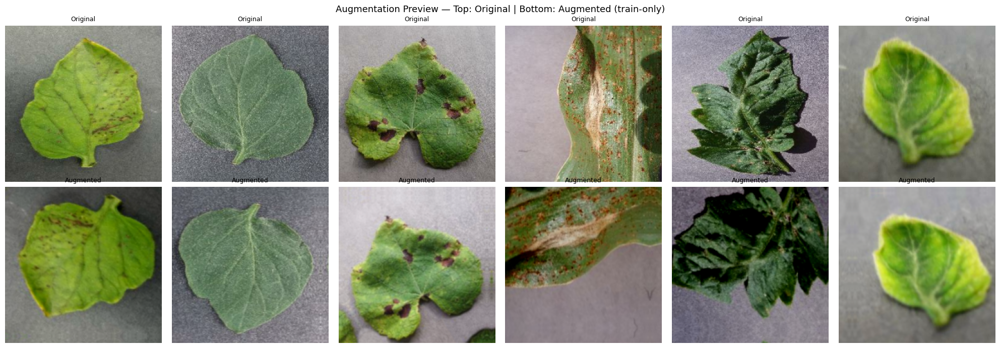


✅ CELL 4 complete — pipelines ready. Augmentation is train-only and does
   not alter dataset size or the train/val ratio.


In [32]:
# ── CELL 4: Data Pipeline & Augmentation ─────────────────────────────────────
from tensorflow.keras import layers
from tensorflow.keras.applications.efficientnet import preprocess_input

AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = CONFIG["IMG_SIZE"]
BATCH_SIZE = CONFIG["BATCH_SIZE"]

# ── Load raw datasets directly from the existing train/val folders ───────────
# NOTE: shuffle=True on train is fine (reshuffles batches each epoch, does not
# change which images belong to train vs val). shuffle=False on val is
# CRITICAL — evaluation code later assumes val batches are in a fixed order
# aligned with `val_ds_raw.file_paths`.
train_ds_raw = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
)

val_ds_raw = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=False,
)

# Keep the exact file order for val — used later for misclassified-image
# inspection and batch prediction reporting.
VAL_FILE_PATHS = list(val_ds_raw.file_paths)

assert train_ds_raw.class_names == CLASS_NAMES, "Class order mismatch between train and CLASS_NAMES."
assert val_ds_raw.class_names == CLASS_NAMES,   "Class order mismatch between val and CLASS_NAMES."

# ── EfficientNet preprocessing (scales internally — do NOT rescale to [0,1] first) ─
def apply_preprocess(images, labels):
    return preprocess_input(images), labels

train_ds = train_ds_raw.map(apply_preprocess, num_parallel_calls=AUTOTUNE)
val_ds   = val_ds_raw.map(apply_preprocess, num_parallel_calls=AUTOTUNE)

# ── Train-only augmentation pipeline ──────────────────────────────────────────
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical", seed=SEED),
    layers.RandomRotation(0.2, seed=SEED, fill_mode="reflect"),
    layers.RandomZoom(0.15, seed=SEED, fill_mode="reflect"),
    layers.RandomTranslation(0.1, 0.1, seed=SEED, fill_mode="reflect"),
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomContrast(0.2, seed=SEED),
], name="train_augmentation")

def augment(images, labels):
    return data_augmentation(images, training=True), labels

train_ds_final = (train_ds
                   .map(augment, num_parallel_calls=AUTOTUNE)
                   .prefetch(AUTOTUNE))
val_ds_final = val_ds.prefetch(AUTOTUNE)   # val stays clean — no augmentation, ever

print(f"Train batches : {len(train_ds_final)}  ({total_train} images)")
print(f"Val batches   : {len(val_ds_final)}  ({total_val} images)")

# ── Visual sanity check: original vs augmented ───────────────────────────────
sample_images, sample_labels = next(iter(train_ds_raw.take(1)))
augmented_preview = data_augmentation(sample_images[:6], training=True)

fig, axes = plt.subplots(2, 6, figsize=(20, 7))
for i in range(6):
    axes[0][i].imshow(sample_images[i].numpy().astype("uint8"))
    axes[0][i].set_title("Original", fontsize=9)
    axes[0][i].axis("off")
    axes[1][i].imshow(np.clip(augmented_preview[i].numpy(), 0, 255).astype("uint8"))
    axes[1][i].set_title("Augmented", fontsize=9)
    axes[1][i].axis("off")
fig.suptitle("Augmentation Preview — Top: Original | Bottom: Augmented (train-only)", fontsize=13)
plt.tight_layout()
plt.savefig("/content/plots/augmentation_preview.png", dpi=130)
plt.show()

print("\n✅ CELL 4 complete — pipelines ready. Augmentation is train-only and does")
print("   not alter dataset size or the train/val ratio.")


## CELL 5 — Model Architecture: EfficientNet-B0 + Classification Head

**Purpose.** Build the backbone + head exactly once, as a reusable function,
so Phase 1 and Phase 2 operate on the *same* model object with only
`trainable` flags and the optimizer changing between phases.

**Why EfficientNet-B0 (kept from both reference notebooks, unchanged):**
- ~4.3M backbone parameters — small enough for on-device / mobile deployment
  later in the RaithaMitra pipeline (TFLite export, CELL 16).
- Compound scaling gives a receptive field well suited to leaf-scale lesion
  features without the depth of larger EfficientNet variants.
- Strong ImageNet pretraining provides robust low-level filters (edges,
  textures, color gradients) that transfer well to leaf imagery.

**Head design:** `GlobalAveragePooling2D → BatchNorm → Dense(256, relu) →
Dropout(0.4) → Dense(num_classes, softmax)`.
- GAP over flattening: averages spatial activations, which is far less prone
  to positional overfitting (a leaf photographed slightly off-center should
  not change the prediction).
- BatchNorm directly after GAP stabilizes the feature scale entering the dense
  head — this matters most in Phase 2, where gradients from a very low
  learning rate are otherwise easy to destabilize.
- Dropout(0.4): moderately strong regularization, appropriate given the class
  imbalance found in CELL 3 (a model with excess capacity is the one most
  likely to just memorize the majority classes).

**`NUM_CLASSES` is never hardcoded** — it is derived from `CLASS_NAMES`,
which was itself derived from the validated dataset folders in CELL 1.


In [33]:
# ── CELL 5: Model Architecture ────────────────────────────────────────────────
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import Model, optimizers

def build_model(num_classes: int, img_size: int = 224, dropout_rate: float = 0.4):
    '''EfficientNet-B0 backbone + a compact, regularized classification head.'''
    inputs = tf.keras.Input(shape=(img_size, img_size, 3), name="input_image")

    base_model = EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_tensor=inputs,
    )
    base_model.trainable = False  # frozen for Phase 1

    x = base_model.output
    x = layers.GlobalAveragePooling2D(name="gap")(x)
    x = layers.BatchNormalization(name="head_bn")(x)
    x = layers.Dense(256, activation="relu", name="disease_features")(x)
    x = layers.Dropout(dropout_rate, seed=SEED, name="head_dropout")(x)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(x)

    model = Model(inputs, outputs, name="RaithaMitra_EfficientNetB0_v3")
    return model, base_model

model, base_model = build_model(NUM_CLASSES, IMG_SIZE)

total_params     = model.count_params()
trainable_params = sum(np.prod(w.shape) for w in model.trainable_weights)

print(f"Model: {model.name}")
print(f"  Base model layers   : {len(base_model.layers)}")
print(f"  Total parameters    : {total_params:,}")
print(f"  Trainable (Phase 1) : {trainable_params:,}")
print(f"  Frozen (Phase 1)    : {total_params - trainable_params:,}")
model.summary(line_length=100)


Model: RaithaMitra_EfficientNetB0_v3
  Base model layers   : 238
  Total parameters    : 4,388,024
  Trainable (Phase 1) : 335,893
  Frozen (Phase 1)    : 4,052,131


Model: "RaithaMitra_EfficientNetB0_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                ┃ Output Shape            ┃        Param # ┃ Connected to            ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)    │ (None, 224, 224, 3)     │              0 │ -                       │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ rescaling_2 (Rescaling)     │ (None, 224, 224, 3)     │              0 │ input_image[0][0]       │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ normalization_1             │ (None, 224, 224, 3)     │              7 │ rescaling_2[0][0]       │
│ (Normalization)             │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ rescaling_3 (Rescaling)     │ (None, 224, 224, 3)     │              0 │ normalization_1[0][0]   │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ stem_conv_pad               │ (None, 225, 225, 3)     │              0 │ rescaling_3[0][0]       │
│ (ZeroPadding2D)             │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ stem_conv (Conv2D)          │ (None, 112, 112, 32)    │            864 │ stem_conv_pad[0][0]     │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ stem_bn                     │ (None, 112, 112, 32)    │            128 │ stem_conv[0][0]         │
│ (BatchNormalization)        │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ stem_activation             │ (None, 112, 112, 32)    │              0 │ stem_bn[0][0]           │
│ (Activation)                │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_dwconv              │ (None, 112, 112, 32)    │            288 │ stem_activation[0][0]   │
│ (DepthwiseConv2D)           │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_bn                  │ (None, 112, 112, 32)    │            128 │ block1a_dwconv[0][0]    │
│ (BatchNormalization)        │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_activation          │ (None, 112, 112, 32)    │              0 │ block1a_bn[0][0]        │
│ (Activation)                │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_se_squeeze          │ (None, 32)              │              0 │ block1a_activation[0][… │
│ (GlobalAveragePooling2D)    │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_se_reshape          │ (None, 1, 1, 32)        │              0 │ block1a_se_squeeze[0][… │
│ (Reshape)                   │                         │                │                         │
├─────────────────────────────┼─────────────────────────┼────────────────┼─────────────────────────┤
│ block1a_se_reduce (Conv2D)  │ (None, 1, 1, 8)         │            264 │ block1a_se_reshape[0][… │
├─────────────────────────────┼─────────────────────────┼────

 Total params: 4,388,024 (16.74 MB)

 Trainable params: 335,893 (1.28 MB)

 Non-trainable params: 4,052,131 (15.46 MB)

## CELL 6 — Class Weights, Macro-F1 Metric, Callbacks & Run Directory

**Purpose.** This cell assembles everything needed to train *responsibly*
given the class imbalance measured in CELL 3, and sets up the output folder
structure so every run is fully reproducible and comparable to prior runs.

**Class weights.** With a `{imbalance_ratio:.0f}×` imbalance ratio, unweighted
cross-entropy lets the optimizer minimize loss by concentrating almost
entirely on the majority classes. `compute_class_weight('balanced')` scales
each class's gradient contribution by `n_samples / (n_classes × n_samples_i)`,
so minority classes are not simply outvoted during training. *(Carried over
from the secondary reference notebook — this was absent from the primary
reference.)*

**Macro-F1 metric.** Accuracy alone cannot reveal minority-class failure —
a model scoring 95% accuracy could still be getting `Grape_healthy` (a small
class) wrong most of the time. We track Macro-F1 (unweighted mean of per-class
F1) during training as a secondary signal, in addition to accuracy and Top-5
accuracy.

**Callback strategy:**

| Callback | Setting | Reason |
|---|---|---|
| `EarlyStopping` | `monitor='val_loss'`, patience 5 (P1) / 7 (P2) | `val_loss` is smoother than `val_accuracy` on an imbalanced set; more patience in P2 because fine-tuning converges more slowly |
| `ReduceLROnPlateau` | factor 0.3–0.5, patience 3–4 | Escapes plateaus without a full LR restart |
| `ModelCheckpoint` | `save_best_only=True` | Keeps the best-val-loss checkpoint, not the last epoch |
| `CSVLogger` | per-phase CSV | Full numeric training history, independent of any plot |
| `TensorBoard` | per-run log dir | Optional live monitoring during long Colab sessions |

**Timestamped run directory.** Every run writes to `outputs/<YYYY_MM_DD_HH_MM>/`
with `models/`, `logs/`, `plots/`, `gradcam/`, `metrics/`, `confusion_matrix/`,
`classification_report/`, and `saved_predictions/` subfolders — so re-running
this notebook never silently overwrites a previous run's artifacts.


In [34]:
# ── CELL 6: Class Weights, Macro-F1, Callbacks, Run Directory ────────────────
from datetime import datetime
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score
from tensorflow.keras import callbacks as kc

# ── Timestamped run directory ─────────────────────────────────────────────────
RUN_ID = datetime.now().strftime("%Y_%m_%d_%H_%M")
RUN_DIR = Path("outputs") / RUN_ID
for sub in ["models", "logs", "plots", "gradcam", "metrics",
            "confusion_matrix", "classification_report", "saved_predictions"]:
    (RUN_DIR / sub).mkdir(parents=True, exist_ok=True)
print(f"Run directory: {RUN_DIR.resolve()}")

# ── Class weights (computed from the TRAIN split file counts — no leakage) ──
train_labels_flat = []
for idx, cls in enumerate(CLASS_NAMES):
    train_labels_flat += [idx] * train_counts[cls]
train_labels_flat = np.array(train_labels_flat)

class_weight_values = compute_class_weight(
    class_weight="balanced",
    classes=np.arange(NUM_CLASSES),
    y=train_labels_flat,
)
CLASS_WEIGHT_DICT = dict(enumerate(class_weight_values))

print("\nTop 5 heaviest (minority) class weights:")
for idx, w in sorted(CLASS_WEIGHT_DICT.items(), key=lambda x: -x[1])[:5]:
    print(f"   {CLASS_NAMES[idx]:<48} → weight = {w:.3f}")
print(f"Weight range: {min(CLASS_WEIGHT_DICT.values()):.3f} – {max(CLASS_WEIGHT_DICT.values()):.3f}")

# ── Macro-F1 metric (epoch-level, sklearn-backed) ────────────────────────────
class MacroF1Score(tf.keras.metrics.Metric):
    '''Accumulates predictions across an epoch and computes sklearn Macro-F1
    at epoch end. Not batch-differentiable (used for monitoring only).'''
    def __init__(self, name="macro_f1", **kwargs):
        super().__init__(name=name, **kwargs)
        self._y_true, self._y_pred = [], []

    def update_state(self, y_true, y_pred, sample_weight=None):
        self._y_true.append(tf.argmax(y_true, axis=-1).numpy())
        self._y_pred.append(tf.argmax(y_pred, axis=-1).numpy())

    def result(self):
        if not self._y_true:
            return tf.constant(0.0)
        yt = np.concatenate(self._y_true)
        yp = np.concatenate(self._y_pred)
        return tf.constant(f1_score(yt, yp, average="macro", zero_division=0), dtype=tf.float32)

    def reset_state(self):
        self._y_true, self._y_pred = [], []

def make_callbacks(phase: str, patience: int, monitor: str = "val_loss"):
    # Save every epoch, directly to Google Drive — survives disconnects/crashes
    drive_ckpt_dir = Path("/content/drive/MyDrive/major project") / RUN_ID / phase
    drive_ckpt_dir.mkdir(parents=True, exist_ok=True)

    epoch_ckpt_path = drive_ckpt_dir / "epoch_{epoch:02d}_valloss_{val_loss:.4f}.keras"
    best_ckpt_path  = drive_ckpt_dir / "best.keras"

    csv_path = RUN_DIR / "logs" / f"training_log_{phase}.csv"
    tb_path  = RUN_DIR / "logs" / f"tensorboard_{phase}"

    return [
        kc.EarlyStopping(monitor=monitor, patience=patience, restore_best_weights=True, verbose=1),
        kc.ReduceLROnPlateau(monitor=monitor, factor=0.4, patience=max(2, patience - 2), min_lr=1e-7, verbose=1),
        # Saves EVERY epoch to Drive — nothing is lost on disconnect
        kc.ModelCheckpoint(str(epoch_ckpt_path), monitor=monitor, save_best_only=False, verbose=1),
        # Also keeps a separate "best so far" copy on Drive
        kc.ModelCheckpoint(str(best_ckpt_path), monitor=monitor, save_best_only=True, verbose=1),
        kc.CSVLogger(str(csv_path)),
        kc.TensorBoard(log_dir=str(tb_path)),
    ], best_ckpt_path

# Save label map immediately — every downstream cell (including a crashed-and-
# restarted session) can recover class ordering from disk.
LABEL_MAP = {i: name for i, name in enumerate(CLASS_NAMES)}
with open(RUN_DIR / "metrics" / "label_map.json", "w") as f:
    json.dump(LABEL_MAP, f, indent=2)

with open(RUN_DIR / "environment.json", "w") as f:
    json.dump({**ENV_INFO, **{"config": CONFIG}}, f, indent=2, default=str)

print("\n✅ CELL 6 complete — class weights, Macro-F1 metric, callbacks, and run")
print(f"   directory ready at: {RUN_DIR}")


Run directory: /content/outputs/2026_07_23_06_46

Top 5 heaviest (minority) class weights:
   Potato___healthy                                 → weight = 8.883
   Tomato___Tomato_mosaic_virus                     → weight = 3.595
   Grape___healthy                                  → weight = 3.171
   Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → weight = 2.622
   Tomato___Leaf_Mold                               → weight = 1.412
Weight range: 0.251 – 8.883

✅ CELL 6 complete — class weights, Macro-F1 metric, callbacks, and run
   directory ready at: outputs/2026_07_23_06_46


## CELL 7 — Phase 1 Training: Frozen Backbone, Classifier Head Only

**Purpose.** Train only the newly-initialized classification head while the
EfficientNet-B0 backbone stays frozen. This lets the head converge to sensible
weights *before* any gradient reaches the pretrained backbone — starting
fine-tuning (Phase 2) with an untrained head would otherwise send large,
destructive gradients back through the pretrained ImageNet features.

- **Learning rate:** `1e-3` — standard for training a freshly-initialized
  Dense head with Adam.
- **Loss:** categorical cross-entropy, weighted via `CLASS_WEIGHT_DICT`
  (CELL 6) to counter the measured class imbalance.
- **Metrics tracked:** accuracy, Top-5 accuracy, Macro-F1.


In [ ]:
# ── CELL 7: Phase 1 Training ──────────────────────────────────────────────────
model.compile(
    optimizer=optimizers.Adam(learning_rate=CONFIG["PHASE1_LR"]),
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.TopKCategoricalAccuracy(k=5, name="top5_acc")],
)

callbacks_phase1, ckpt_phase1 = make_callbacks("phase1", patience=5)

print("Phase 1: training classifier head only (backbone FROZEN)")
print(f"  LR          : {CONFIG['PHASE1_LR']}")
print(f"  Max epochs  : {CONFIG['PHASE1_EPOCHS']}")
print(f"  Class weights applied: yes")

history_phase1 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    epochs=CONFIG["PHASE1_EPOCHS"],
    class_weight=CLASS_WEIGHT_DICT,
    callbacks=callbacks_phase1,
    verbose=1,
)

with open(RUN_DIR / "metrics" / "history_phase1.json", "w") as f:
    json.dump({k: [float(v) for v in vals] for k, vals in history_phase1.history.items()}, f, indent=2)

val_loss1, val_acc1, val_top5_1 = model.evaluate(val_ds_final, verbose=0)
print(f"\n✅ Phase 1 complete — Val Accuracy: {val_acc1:.4f} | Val Top-5: {val_top5_1:.4f}")
print(f"   Best checkpoint saved to: {ckpt_phase1}")


Phase 1: training classifier head only (backbone FROZEN)
  LR          : 0.001
  Max epochs  : 15
  Class weights applied: yes
Epoch 1/15
706/706 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.6431 - loss: 1.2217 - top5_acc: 0.9010
Epoch 1: saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase1/epoch_01_valloss_0.3862.keras

Epoch 1: finished saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase1/epoch_01_valloss_0.3862.keras

Epoch 1: val_loss improved from None to 0.38624, saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase1/best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase1/best.keras
706/706 ━━━━━━━━━━━━━━━━━━━━ 481s 632ms/step - accuracy: 0.7481 - loss: 0.8056 - top5_acc: 0.9602 - val_accuracy: 0.8634 - val_loss: 0.3862 - val_top5_acc: 0.9926 - learning_rate: 0.0010
Epoch 2/15
705/706 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - accuracy: 0.8387 - loss: 0.4749 - to

## CELL 8 — Phase 1 Training Curves

**Purpose.** Visual diagnostics catch problems (overfitting, an unstable LR,
a plateau that early stopping should have caught) faster than reading raw
numbers. Figures are saved to disk so they can be attached to a report or viva
presentation directly, without re-running training.


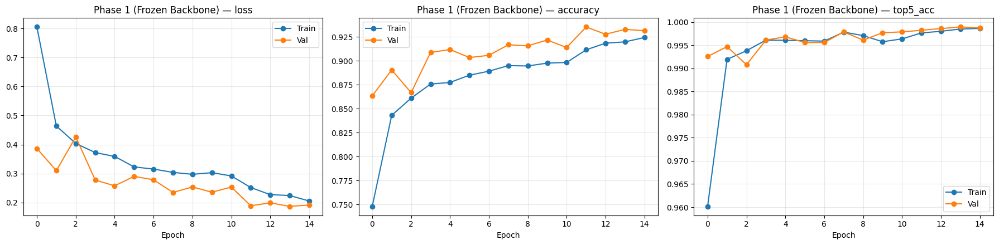

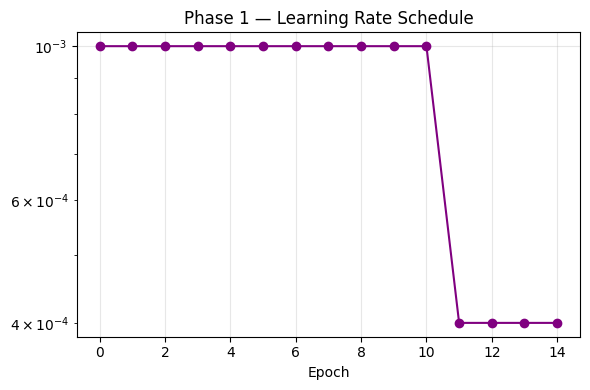

✅ CELL 8 complete — Phase 1 curves saved to outputs/2026_07_22_19_24/plots


In [ ]:
# ── CELL 8: Phase 1 Training Visualization ───────────────────────────────────
def plot_phase_history(history, phase_name: str, save_path: Path):
    metrics_to_plot = [m for m in ["loss", "accuracy", "top5_acc"] if m in history.history]
    n = len(metrics_to_plot)
    fig, axes = plt.subplots(1, n, figsize=(6 * n, 4.5))
    if n == 1:
        axes = [axes]
    for ax, metric in zip(axes, metrics_to_plot):
        ax.plot(history.history[metric], marker="o", label="Train")
        ax.plot(history.history[f"val_{metric}"], marker="o", label="Val")
        ax.set_title(f"{phase_name} — {metric}")
        ax.set_xlabel("Epoch")
        ax.legend()
        ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path, dpi=130)
    plt.show()

plot_phase_history(history_phase1, "Phase 1 (Frozen Backbone)",
                    RUN_DIR / "plots" / "phase1_curves.png")

# Learning-rate curve (from CSV log, since LR isn't in history.history by default)
lr_log_path = RUN_DIR / "logs" / "training_log_phase1.csv"
if lr_log_path.exists():
    import pandas as pd
    df = pd.read_csv(lr_log_path)
    if "learning_rate" in df.columns:
        plt.figure(figsize=(6, 4))
        plt.plot(df["learning_rate"], marker="o", color="purple")
        plt.title("Phase 1 — Learning Rate Schedule")
        plt.xlabel("Epoch")
        plt.yscale("log")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(RUN_DIR / "plots" / "phase1_lr_curve.png", dpi=130)
        plt.show()

print("✅ CELL 8 complete — Phase 1 curves saved to", RUN_DIR / "plots")


## CELL 9 — Phase 2: Controlled Fine-Tuning of the Upper Backbone

**Purpose.** Unfreeze the top `FINE_TUNE_LAYERS` layers of EfficientNet-B0 and
continue training at a much lower learning rate, so the backbone's high-level
filters can specialize toward disease-lesion morphology without destroying
the pretrained ImageNet representations underneath.

**Why the top 20 layers specifically:** EfficientNet-B0 has ~237 layers.
Layers 0–~215 encode universal low/mid-level features (edges, color
gradients, simple textures) that are already close to optimal and gain little
from further training on a comparatively small dataset. The final block
(`block7a_*` and `top_conv`/`top_bn`) encodes the highest-level, most
task-specific features — the ones most relevant to distinguishing, say, a
bacterial-spot lesion pattern from a fungal one.

**Why LR = 1e-5 (100× lower than Phase 1):** small enough that weight updates
nudge rather than overwrite pretrained filters; large enough to meaningfully
shift the unfrozen layers over 20+ epochs. This is the standard fine-tuning
LR ratio recommended for transfer learning on convolutional backbones.

**Critical implementation detail:** the model **must** be recompiled after
changing `trainable` flags — Keras does not pick up trainability changes on
an already-compiled model.


In [ ]:
# ── CELL 9: Phase 2 Fine-Tuning ───────────────────────────────────────────────
FINE_TUNE_LAYERS = CONFIG["FINE_TUNE_LAYERS"]

base_model.trainable = True
unfreeze_from = len(base_model.layers) - FINE_TUNE_LAYERS
for i, layer in enumerate(base_model.layers):
    layer.trainable = (i >= unfreeze_from)

n_trainable_layers = sum(1 for l in base_model.layers if l.trainable)
print(f"Unfrozen {n_trainable_layers} layers (top {FINE_TUNE_LAYERS} of the backbone):")
for l in base_model.layers:
    if l.trainable:
        print(f"   ✓ {l.name}")

# CRITICAL: recompile after changing trainable flags
model.compile(
    optimizer=optimizers.Adam(learning_rate=CONFIG["PHASE2_LR"]),
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.TopKCategoricalAccuracy(k=5, name="top5_acc")],
)

trainable_params_p2 = sum(np.prod(w.shape) for w in model.trainable_weights)
print(f"\nTrainable parameters (Phase 2): {trainable_params_p2:,}")

callbacks_phase2, ckpt_phase2 = make_callbacks("phase2", patience=7)

print("\nPhase 2: fine-tuning top backbone layers + head")
print(f"  LR          : {CONFIG['PHASE2_LR']}")
print(f"  Max epochs  : {CONFIG['PHASE2_EPOCHS']}")

history_phase2 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    epochs=CONFIG["PHASE2_EPOCHS"],
    class_weight=CLASS_WEIGHT_DICT,
    callbacks=callbacks_phase2,
    verbose=1,
)

with open(RUN_DIR / "metrics" / "history_phase2.json", "w") as f:
    json.dump({k: [float(v) for v in vals] for k, vals in history_phase2.history.items()}, f, indent=2)

val_loss2, val_acc2, val_top5_2 = model.evaluate(val_ds_final, verbose=0)
print(f"\n✅ Phase 2 complete — Val Accuracy: {val_acc2:.4f} | Val Top-5: {val_top5_2:.4f}")
print(f"   Best checkpoint saved to: {ckpt_phase2}")

# Save the final (best-restored) model explicitly for downstream cells
FINAL_MODEL_PATH = RUN_DIR / "models" / "final_model.keras"
model.save(FINAL_MODEL_PATH)
print(f"   Final model saved to: {FINAL_MODEL_PATH}")


Unfrozen 20 layers (top 20 of the backbone):
   ✓ block6d_project_conv
   ✓ block6d_project_bn
   ✓ block6d_drop
   ✓ block6d_add
   ✓ block7a_expand_conv
   ✓ block7a_expand_bn
   ✓ block7a_expand_activation
   ✓ block7a_dwconv
   ✓ block7a_bn
   ✓ block7a_activation
   ✓ block7a_se_squeeze
   ✓ block7a_se_reshape
   ✓ block7a_se_reduce
   ✓ block7a_se_expand
   ✓ block7a_se_excite
   ✓ block7a_project_conv
   ✓ block7a_project_bn
   ✓ top_conv
   ✓ top_bn
   ✓ top_activation

Trainable parameters (Phase 2): 1,686,853

Phase 2: fine-tuning top backbone layers + head
  LR          : 1e-05
  Max epochs  : 25
Epoch 1/25
706/706 ━━━━━━━━━━━━━━━━━━━━ 0s 592ms/step - accuracy: 0.8217 - loss: 0.5702 - top5_acc: 0.9857
Epoch 1: saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase2/epoch_01_valloss_0.3095.keras

Epoch 1: finished saving model to /content/drive/MyDrive/major project/2026_07_22_19_24/phase2/epoch_01_valloss_0.3095.keras

Epoch 1: val_loss improved from Non

## CELL 9b — Phase 2 Training Curves (Combined View)

Plotted together with Phase 1 so the transition point (where fine-tuning
begins) is visible on a single timeline — a jump or dip right at that
boundary is diagnostic of too-aggressive an unfreezing/LR choice.


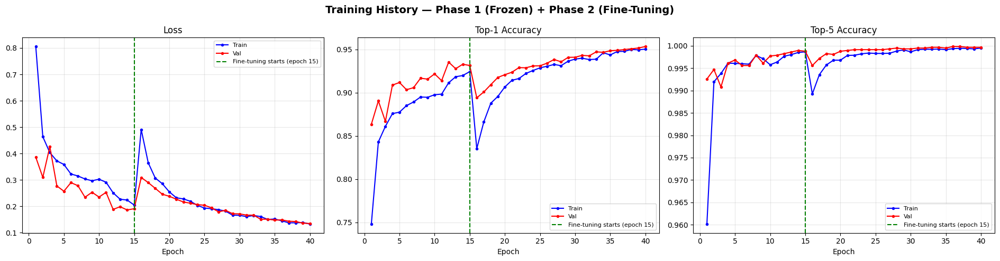


 FINAL PHASE 2 VALIDATION METRICS
  Top-1 Accuracy : 0.9534
  Top-5 Accuracy : 0.9996


In [ ]:
# ── Combined Phase 1 + Phase 2 curves ────────────────────────────────────────
def plot_combined_history(h1, h2, save_path: Path):
    metrics = ["loss", "accuracy", "top5_acc"]
    labels = ["Loss", "Top-1 Accuracy", "Top-5 Accuracy"]
    fig, axes = plt.subplots(1, 3, figsize=(19, 5))
    transition = len(h1.history["loss"])
    for ax, metric, label in zip(axes, metrics, labels):
        train_full = h1.history.get(metric, []) + h2.history.get(metric, [])
        val_full   = h1.history.get(f"val_{metric}", []) + h2.history.get(f"val_{metric}", [])
        epochs = range(1, len(train_full) + 1)
        ax.plot(epochs, train_full, "b-o", markersize=3, label="Train")
        ax.plot(epochs, val_full, "r-o", markersize=3, label="Val")
        ax.axvline(transition, color="green", linestyle="--", label=f"Fine-tuning starts (epoch {transition})")
        ax.set_title(label)
        ax.set_xlabel("Epoch")
        ax.legend(fontsize=8)
        ax.grid(alpha=0.3)
    fig.suptitle("Training History — Phase 1 (Frozen) + Phase 2 (Fine-Tuning)", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path, dpi=130)
    plt.show()

plot_combined_history(history_phase1, history_phase2, RUN_DIR / "plots" / "combined_training_history.png")

print(f"\n{'='*55}\n FINAL PHASE 2 VALIDATION METRICS\n{'='*55}")
print(f"  Top-1 Accuracy : {val_acc2:.4f}")
print(f"  Top-5 Accuracy : {val_top5_2:.4f}")
print(f"{'='*55}")


In [35]:
# ── Recovery cell: reload trained model, fix RUN_DIR, resume from evaluation ──
from pathlib import Path
from datetime import datetime

# Point RUN_DIR at Drive from now on
RUN_ID = datetime.now().strftime("%Y_%m_%d_%H_%M")
RUN_DIR = Path("/content/drive/MyDrive/major project dataset") / RUN_ID
for sub in ["models", "logs", "plots", "gradcam", "metrics",
            "confusion_matrix", "classification_report", "saved_predictions"]:
    (RUN_DIR / sub).mkdir(parents=True, exist_ok=True)

# Reload your already-trained Phase 2 model from Drive
model = tf.keras.models.load_model(
    "/content/drive/MyDrive/major project/2026_07_22_19_24/phase2/best.keras"
)

# Re-fetch base_model reference (needed later, e.g. if you inspect trainable layers)
base_model = model.get_layer(index=1) if "efficientnet" in model.layers[1].name.lower() else None

FINAL_MODEL_PATH = RUN_DIR / "models" / "final_model.keras"
model.save(FINAL_MODEL_PATH)

print(f"✅ Model reloaded and RUN_DIR fixed: {RUN_DIR}")

✅ Model reloaded and RUN_DIR fixed: /content/drive/MyDrive/major project dataset/2026_07_23_06_46


## CELL 10 — Deployment-Focused Evaluation

**Purpose.** Accuracy alone is an incomplete — sometimes misleading —
description of model quality on an imbalanced dataset. This cell computes the
full deployment-relevant metric set and makes minority-class failure visible
rather than averaging it away, following the evaluation philosophy from the
secondary reference notebook.

**Metrics computed:**
- Top-1 / Top-5 accuracy
- Macro Precision / Recall / F1 (unweighted mean across classes — every class
  counts equally regardless of size)
- Weighted F1 (frequency-weighted — closer to what plain accuracy reports)
- Full `sklearn.classification_report` (per-class precision/recall/F1/support)
- Per-class accuracy, with explicit **best** and **worst** performing classes
  called out
- A normalized confusion matrix (row = true class, cell = recall), so
  cross-crop confusions such as Tomato↔Potato are immediately visible as
  off-diagonal mass rather than buried in raw counts.

The interpretation guidance below the numbers (macro-F1 thresholds) is
carried over from the secondary reference notebook, since it is a useful,
concrete rule of thumb for a viva or report discussion.


Generating predictions on the validation set...

 DEPLOYMENT EVALUATION REPORT
  Top-1 Accuracy    : 0.9534 (95.34%)
  Top-5 Accuracy    : 0.9996 (99.96%)
  Macro F1 Score    : 0.9499
  Weighted F1 Score : 0.9534
  Macro Precision   : 0.9502
  Macro Recall      : 0.9517
✅ Strong Macro F1 — good generalization across classes.

Per-Class Classification Report:
                                                    precision    recall  f1-score   support

Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.88      0.78      0.82       103
                       Corn_(maize)___Common_rust_       1.00      0.99      1.00       239
               Corn_(maize)___Northern_Leaf_Blight       0.88      0.94      0.91       197
                            Corn_(maize)___healthy       1.00      1.00      1.00       233
                                 Grape___Black_rot       0.97      0.97      0.97       236
                      Grape___Esca_(Black_Measles)       0.98      0.98      0.98     

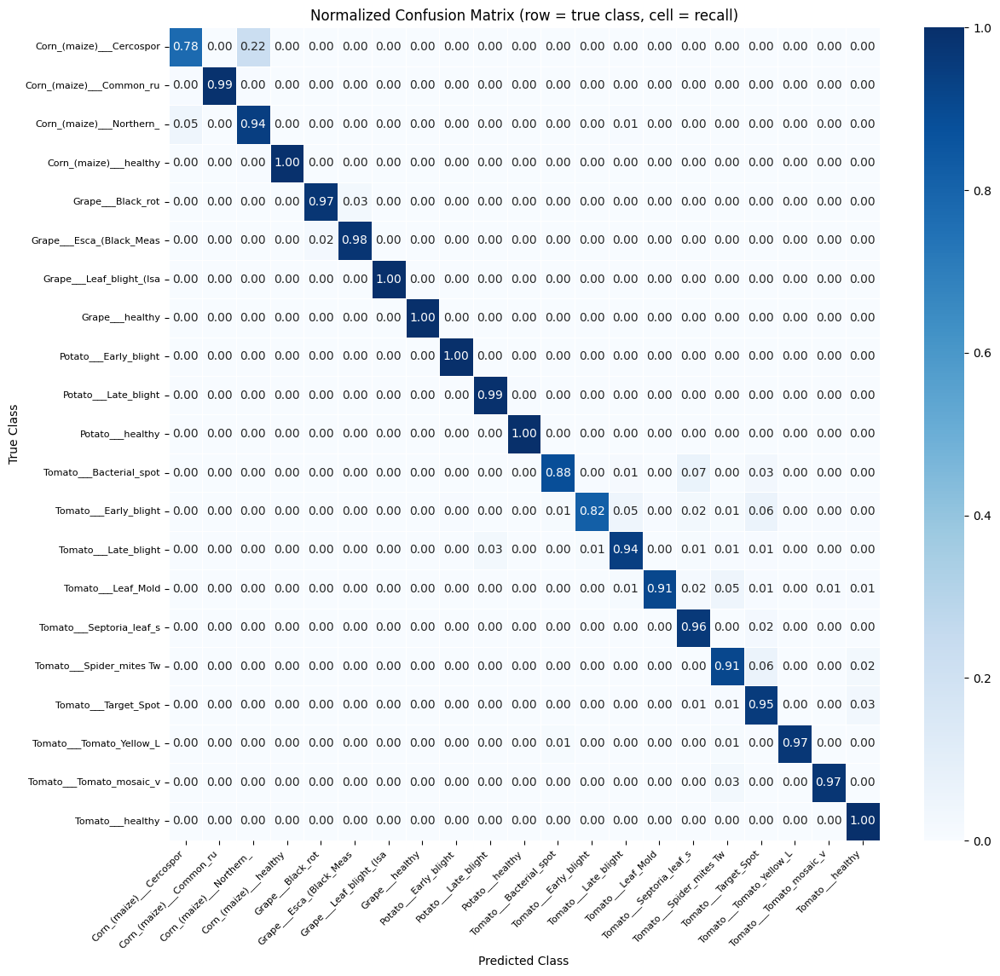


✅ CELL 10 complete — full evaluation artifacts saved under /content/drive/MyDrive/major project dataset/2026_07_23_06_46


In [36]:
# ── CELL 10: Final Evaluation ─────────────────────────────────────────────────
from sklearn.metrics import (
    classification_report, confusion_matrix,
    f1_score, precision_score, recall_score,
)
import seaborn as sns

print("Generating predictions on the validation set...")
y_true, y_pred_probs = [], []
for images, labels in val_ds_final:
    preds = model.predict(images, verbose=0)
    y_pred_probs.append(preds)
    y_true.append(np.argmax(labels.numpy(), axis=1))

y_pred_probs = np.concatenate(y_pred_probs, axis=0)
y_true = np.concatenate(y_true, axis=0)
y_pred = np.argmax(y_pred_probs, axis=1)

assert len(y_true) == len(VAL_FILE_PATHS), (
    "Mismatch between number of validation labels and VAL_FILE_PATHS — "
    "val_ds must not be shuffled."
)

top1_acc    = float(np.mean(y_pred == y_true))
macro_f1    = f1_score(y_true, y_pred, average="macro", zero_division=0)
weighted_f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)
macro_prec  = precision_score(y_true, y_pred, average="macro", zero_division=0)
macro_rec   = recall_score(y_true, y_pred, average="macro", zero_division=0)

top5_correct = sum(
    1 for i, t in enumerate(y_true) if t in np.argsort(y_pred_probs[i])[-5:]
)
top5_acc = top5_correct / len(y_true)

print(f"\n{'='*55}\n DEPLOYMENT EVALUATION REPORT\n{'='*55}")
print(f"  Top-1 Accuracy    : {top1_acc:.4f} ({top1_acc*100:.2f}%)")
print(f"  Top-5 Accuracy    : {top5_acc:.4f} ({top5_acc*100:.2f}%)")
print(f"  Macro F1 Score    : {macro_f1:.4f}")
print(f"  Weighted F1 Score : {weighted_f1:.4f}")
print(f"  Macro Precision   : {macro_prec:.4f}")
print(f"  Macro Recall      : {macro_rec:.4f}")
print(f"{'='*55}")

if macro_f1 < 0.75:
    print("⚠️  Macro F1 < 0.75 — minority classes are likely underperforming.")
elif macro_f1 < 0.85:
    print("✅ Macro F1 in an acceptable range — check per-class recall below.")
else:
    print("✅ Strong Macro F1 — good generalization across classes.")

# ── Per-class report ───────────────────────────────────────────────────────
report_str = classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0)
print("\nPer-Class Classification Report:\n" + report_str)
with open(RUN_DIR / "classification_report" / "report.txt", "w") as f:
    f.write(report_str)

report_dict = classification_report(y_true, y_pred, target_names=CLASS_NAMES,
                                     zero_division=0, output_dict=True)
with open(RUN_DIR / "classification_report" / "report.json", "w") as f:
    json.dump(report_dict, f, indent=2)

# ── Per-class accuracy + best/worst ───────────────────────────────────────────
per_class_recall = recall_score(y_true, y_pred, average=None, zero_division=0)
per_class_acc = {CLASS_NAMES[i]: float(per_class_recall[i]) for i in range(NUM_CLASSES)}
ranked = sorted(per_class_acc.items(), key=lambda x: x[1])

print("\n🔻 Worst 5 classes (by recall):")
for name, acc in ranked[:5]:
    print(f"   {name:<48} → {acc:.3f}")
print("\n🔺 Best 5 classes (by recall):")
for name, acc in ranked[-5:][::-1]:
    print(f"   {name:<48} → {acc:.3f}")

with open(RUN_DIR / "metrics" / "per_class_accuracy.json", "w") as f:
    json.dump(per_class_acc, f, indent=2)

# ── Normalized confusion matrix ───────────────────────────────────────────────
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-8)

plt.figure(figsize=(max(12, NUM_CLASSES * 0.6), max(10, NUM_CLASSES * 0.55)))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=[c[:24] for c in CLASS_NAMES],
            yticklabels=[c[:24] for c in CLASS_NAMES], linewidths=0.4)
plt.title("Normalized Confusion Matrix (row = true class, cell = recall)")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.savefig(RUN_DIR / "confusion_matrix" / "confusion_matrix.png", dpi=130, bbox_inches="tight")
plt.show()

np.save(RUN_DIR / "confusion_matrix" / "confusion_matrix_raw.npy", cm)

EVAL_SUMMARY = {
    "top1_accuracy": top1_acc, "top5_accuracy": top5_acc,
    "macro_f1": macro_f1, "weighted_f1": weighted_f1,
    "macro_precision": macro_prec, "macro_recall": macro_rec,
}
with open(RUN_DIR / "metrics" / "eval_summary.json", "w") as f:
    json.dump(EVAL_SUMMARY, f, indent=2)

print(f"\n✅ CELL 10 complete — full evaluation artifacts saved under {RUN_DIR}")


## CELL 11 — Misclassified Image Inspection

**Purpose.** Aggregate metrics tell you *that* the model is wrong on certain
classes; looking at the actual misclassified images tells you *why* — blurry
photos, ambiguous early-stage lesions, or genuine visual similarity between
two diseases (e.g. early blight vs. late blight) each call for a different
fix. This is a fast, high-value diagnostic step before deciding on next
actions (more data? different augmentation? a hierarchical classifier?).


Misclassified: 263 / 5645 (4.7%)


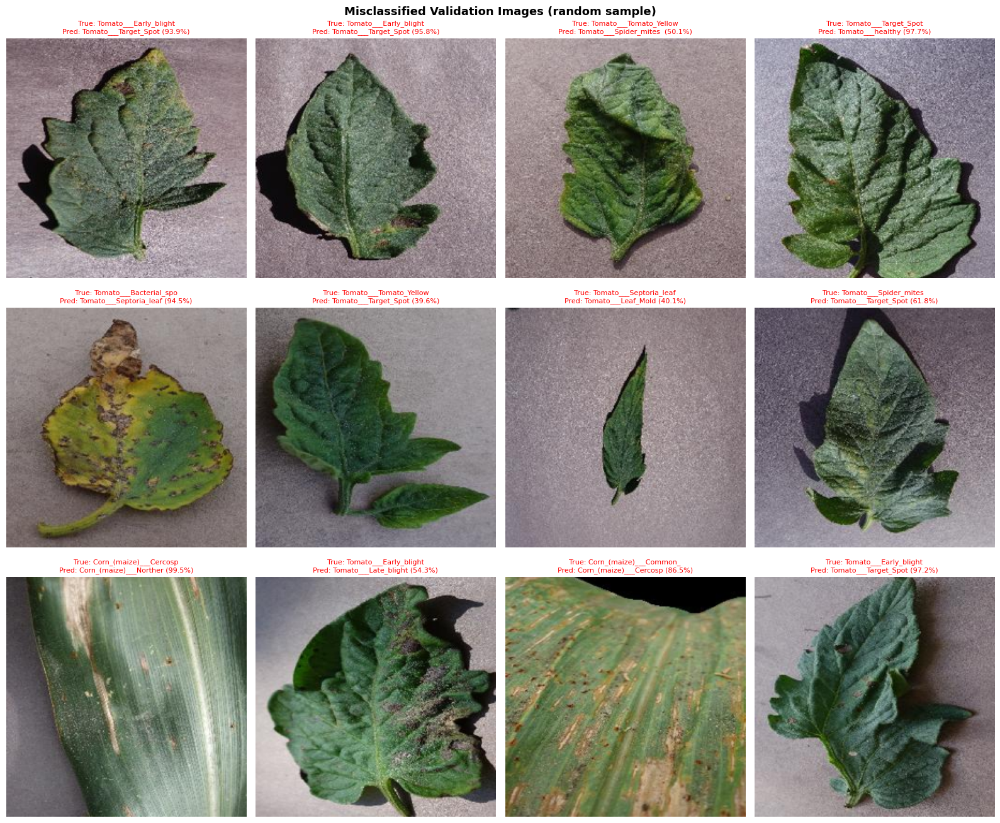

✅ CELL 11 complete.


In [37]:
# ── CELL 11: Misclassified Images ────────────────────────────────────────────
misclassified_idx = np.where(y_pred != y_true)[0]
print(f"Misclassified: {len(misclassified_idx)} / {len(y_true)} "
      f"({len(misclassified_idx)/len(y_true):.1%})")

n_show = min(12, len(misclassified_idx))
if n_show > 0:
    show_idx = np.random.RandomState(SEED).choice(misclassified_idx, n_show, replace=False)
    cols = 4
    rows = int(np.ceil(n_show / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4.5))
    axes = np.array(axes).reshape(-1)

    misclassified_records = []
    for ax, idx in zip(axes, show_idx):
        img_path = VAL_FILE_PATHS[idx]
        img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
        true_cls = CLASS_NAMES[y_true[idx]]
        pred_cls = CLASS_NAMES[y_pred[idx]]
        confidence = float(y_pred_probs[idx][y_pred[idx]])
        top5_idx = np.argsort(y_pred_probs[idx])[-5:][::-1]
        top5 = [(CLASS_NAMES[i], float(y_pred_probs[idx][i])) for i in top5_idx]

        ax.imshow(img)
        ax.set_title(f"True: {true_cls[:22]}\nPred: {pred_cls[:22]} ({confidence:.1%})",
                     fontsize=8, color="red")
        ax.axis("off")

        misclassified_records.append({
            "file": str(img_path), "true_label": true_cls, "predicted_label": pred_cls,
            "confidence": confidence, "top5": top5,
        })

    for ax in axes[n_show:]:
        ax.axis("off")

    plt.suptitle("Misclassified Validation Images (random sample)", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig(RUN_DIR / "plots" / "misclassified_samples.png", dpi=130)
    plt.show()

    with open(RUN_DIR / "metrics" / "misclassified_sample.json", "w") as f:
        json.dump(misclassified_records, f, indent=2)

print("✅ CELL 11 complete.")


## CELL 12 — Single-Image Prediction Utility

**Purpose.** A reusable prediction function that the RaithaMitra app backend
(or this notebook interactively) can call for a single uploaded photo. It
loads and preprocesses the image exactly as training data was preprocessed
(same `preprocess_input`, same target size) — a mismatch here is one of the
most common silent bugs in deployed vision models — and returns both the
top prediction and the full Top-5 breakdown with a probability chart.


Demo predictions on random validation images:



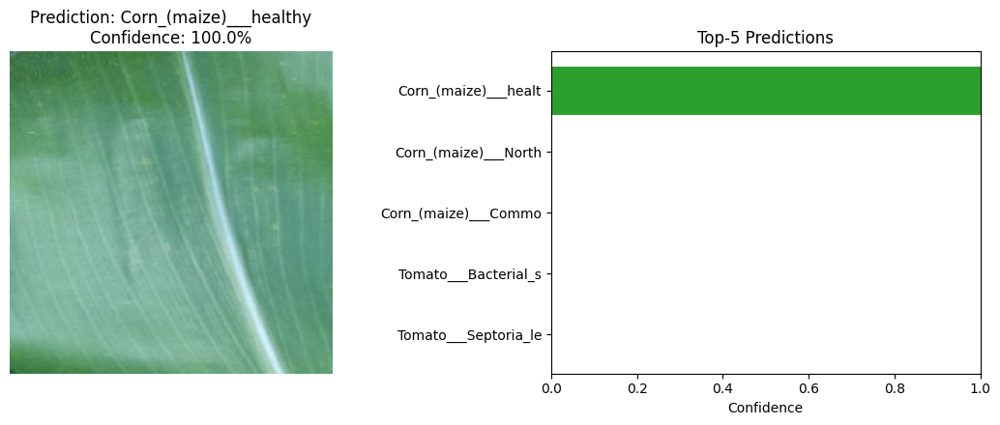

  2930a76c-f0f6-4880-8ec7-f06aaaf257d1___R.S_HL 8155 copy.jpg → Corn_(maize)___healthy (100.0%)


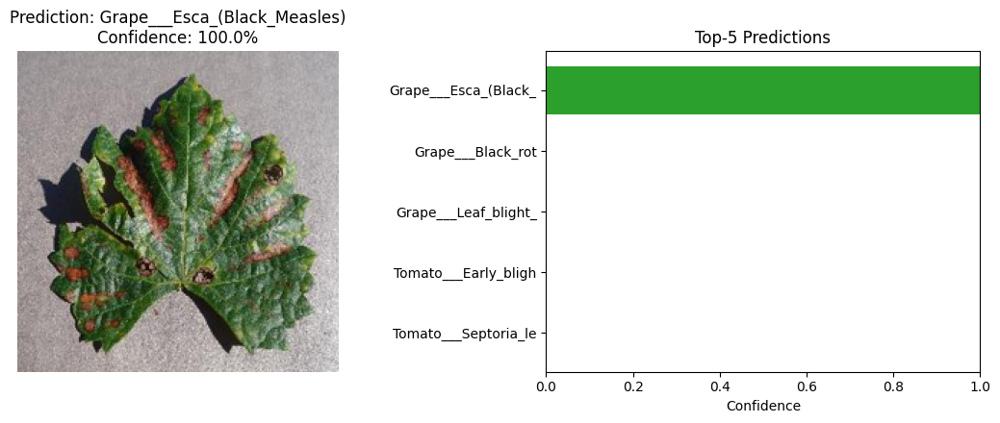

  fdf922fe-da7c-43a0-8e31-7c63ff8d5b2c___FAM_B.Msls 4284.JPG → Grape___Esca_(Black_Measles) (100.0%)


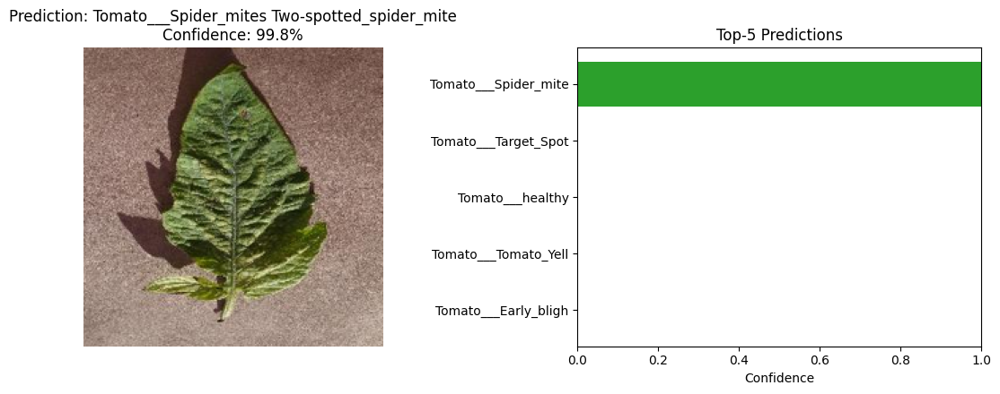

  adb33e14-0bb3-4c1a-bb17-6c2f71993d90___Com.G_SpM_FL 9043.JPG → Tomato___Spider_mites Two-spotted_spider_mite (99.8%)

✅ CELL 12 complete — use predict_single_image(path_or_array, model, CLASS_NAMES)
   for any new image, including an uploaded file via google.colab.files.upload().


In [38]:
# ── CELL 12: Single-Image Prediction Utility ─────────────────────────────────
def predict_single_image(image_path_or_array, model, class_names, img_size=IMG_SIZE, show=True):
    '''
    Predict the disease class for a single image.
    Accepts a file path/Path OR an (H, W, 3) uint8 numpy array (e.g. from an upload widget).
    '''
    if isinstance(image_path_or_array, (str, Path)):
        img = Image.open(image_path_or_array).convert("RGB").resize((img_size, img_size))
        img_array = np.array(img, dtype="float32")
    else:
        img = Image.fromarray(np.uint8(image_path_or_array)).convert("RGB").resize((img_size, img_size))
        img_array = np.array(img, dtype="float32")

    img_batch = preprocess_input(np.expand_dims(img_array, axis=0))
    preds = model.predict(img_batch, verbose=0)[0]

    top_idx = int(np.argmax(preds))
    top5_idx = np.argsort(preds)[-5:][::-1]
    top5 = [{"class": class_names[i], "confidence": float(preds[i])} for i in top5_idx]

    result = {
        "predicted_class": class_names[top_idx],
        "confidence": float(preds[top_idx]),
        "top5": top5,
    }

    if show:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4.5))
        ax1.imshow(np.uint8(img_array))
        ax1.set_title(f"Prediction: {result['predicted_class']}\nConfidence: {result['confidence']:.1%}")
        ax1.axis("off")
        names = [t["class"][:20] for t in top5][::-1]
        vals = [t["confidence"] for t in top5][::-1]
        ax2.barh(names, vals, color="#2ca02c")
        ax2.set_xlim(0, 1)
        ax2.set_title("Top-5 Predictions")
        ax2.set_xlabel("Confidence")
        plt.tight_layout()
        plt.show()

    return result

# ── Demo on a few random validation images ────────────────────────────────────
print("Demo predictions on random validation images:\n")
demo_paths = np.random.RandomState(SEED).choice(VAL_FILE_PATHS, 3, replace=False)
for p in demo_paths:
    r = predict_single_image(p, model, CLASS_NAMES)
    print(f"  {Path(p).name} → {r['predicted_class']} ({r['confidence']:.1%})")

print("\n✅ CELL 12 complete — use predict_single_image(path_or_array, model, CLASS_NAMES)")
print("   for any new image, including an uploaded file via google.colab.files.upload().")


## CELL 13 — Batch Prediction Utility

**Purpose.** Predict every image inside an arbitrary folder (e.g. a fresh
batch of field photos collected for testing, or a folder of images awaiting
labeling) and persist results as CSV — useful both for offline evaluation on
new data and as a lightweight "labeling assistant" workflow.


In [39]:
# ── CELL 13: Batch Prediction ─────────────────────────────────────────────────
import csv

def predict_folder(folder_path, model, class_names, img_size=IMG_SIZE,
                    confidence_threshold=None, save_csv_path=None):
    '''Run predict_single_image over every image in `folder_path` (non-recursive
    by default). Returns a list of result dicts and optionally writes a CSV.'''
    folder_path = Path(folder_path)
    image_files = sorted([f for f in folder_path.iterdir() if f.suffix.lower() in VALID_EXTS])

    results = []
    for f in image_files:
        r = predict_single_image(f, model, class_names, img_size=img_size, show=False)
        r["file"] = str(f)
        if confidence_threshold is not None:
            r["status"] = "confident" if r["confidence"] >= confidence_threshold else "uncertain"
        results.append(r)

    if save_csv_path is not None and results:
        with open(save_csv_path, "w", newline="") as f:
            writer = csv.writer(f)
            writer.writerow(["file", "predicted_class", "confidence", "status"])
            for r in results:
                writer.writerow([r["file"], r["predicted_class"], f"{r['confidence']:.4f}",
                                  r.get("status", "n/a")])
        print(f"Batch predictions saved to: {save_csv_path}")

    return results

# ── Demo: batch-predict a small slice of the val folder (stand-in for a real
# "new photos" folder) ───────────────────────────────────────────────────────
demo_folder = VAL_DIR / CLASS_NAMES[0]
demo_results = predict_folder(
    demo_folder, model, CLASS_NAMES,
    confidence_threshold=CONFIG["CONFIDENCE_THRESHOLD"],
    save_csv_path=RUN_DIR / "saved_predictions" / "batch_predictions_demo.csv",
)
print(f"\nPredicted {len(demo_results)} images from {demo_folder.name}/")
for r in demo_results[:5]:
    print(f"   {Path(r['file']).name:<45} → {r['predicted_class']:<35} "
          f"({r['confidence']:.1%}, {r.get('status')})")

print("\n✅ CELL 13 complete — use predict_folder(folder_path, model, CLASS_NAMES, ...)")
print("   to score any folder of images, e.g. newly collected field photos.")


Batch predictions saved to: /content/drive/MyDrive/major project dataset/2026_07_23_06_46/saved_predictions/batch_predictions_demo.csv

Predicted 103 images from Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot/
   065fe7da-dcaf-41be-9332-5ec5ebceb94b___RS_GLSp 9337.JPG → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (79.9%, confident)
   06785548-9756-4410-b3c2-55cc089276ce___RS_GLSp 4288.JPG → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (51.1%, uncertain)
   06830ecc-28d2-4ec9-a553-4d7905a12dbf___RS_GLSp 4355 copy.jpg → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (80.9%, confident)
   1157b4eb-dfb3-41b7-a083-77b0ca2e7634___RS_GLSp 4460.JPG → Corn_(maize)___Northern_Leaf_Blight (98.0%, confident)
   137762d7-fcd5-405c-a4d5-4096321951d0___RS_GLSp 9345.JPG → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (99.8%, confident)

✅ CELL 13 complete — use predict_folder(folder_path, model, CLASS_NAMES, ...)
   to score any folder of images, e.g. newly collected field p

## CELL 14 — Grad-CAM Explainability

**Purpose.** Grad-CAM answers a single, critical trust question: *what part of
the image drove this prediction?* For a farmer-facing diagnosis tool, a model
that activates on the actual lesion is trustworthy; a model that activates on
background soil, shadow, or the frame edge has learned a shortcut and will
fail unpredictably on new field photos, even if validation accuracy looks
excellent. This is the single most important qualitative diagnostic in this
notebook.

**Target layer:** `top_conv` — the last convolutional layer before global
pooling, giving the highest-level spatial activation map available.


Running Grad-CAM on one sample per class (first 6 classes shown)...
Check: does activation (red/yellow) land on the LESION, or on the BACKGROUND?
Background activation indicates a shortcut-learning failure mode.



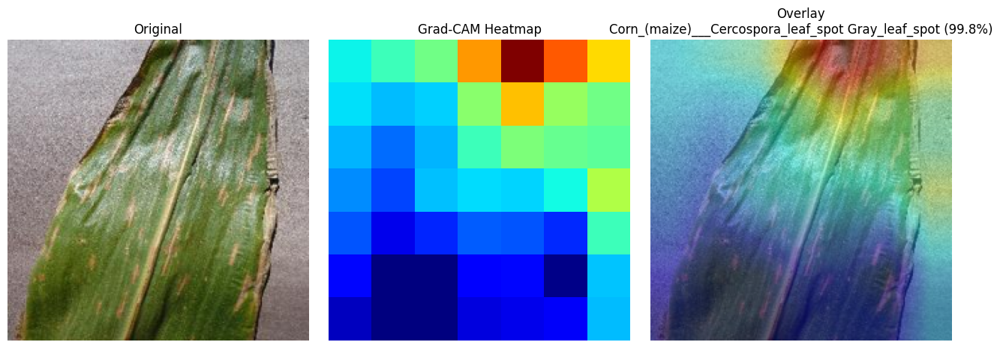

  Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (99.8%)


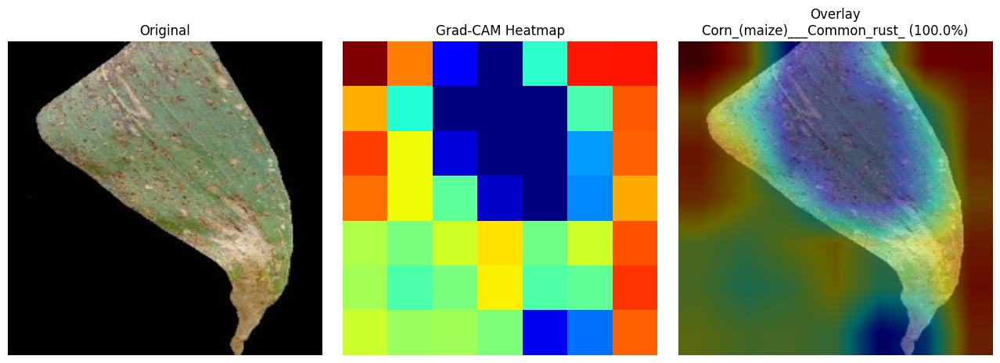

  Corn_(maize)___Common_rust_              → predicted: Corn_(maize)___Common_rust_ (100.0%)


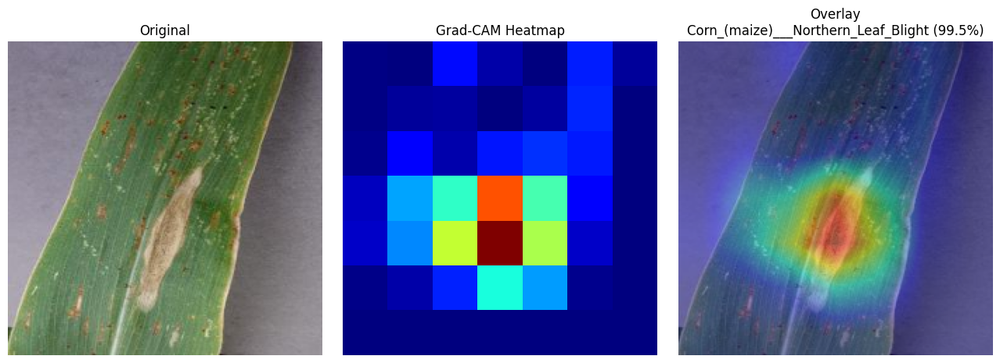

  Corn_(maize)___Northern_Leaf_Blight      → predicted: Corn_(maize)___Northern_Leaf_Blight (99.5%)


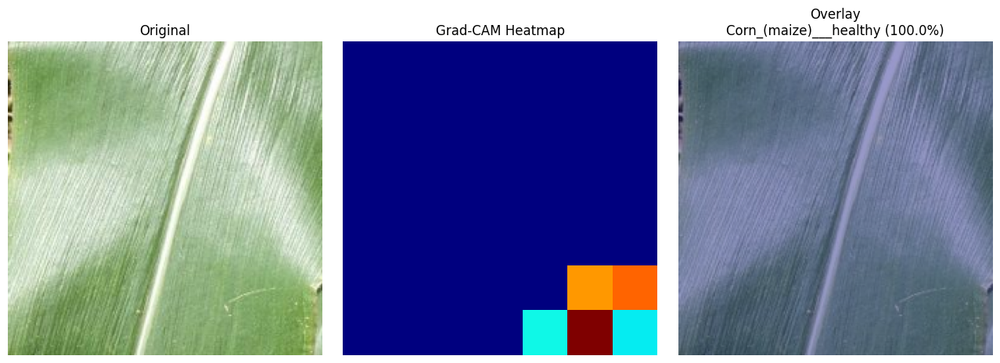

  Corn_(maize)___healthy                   → predicted: Corn_(maize)___healthy (100.0%)


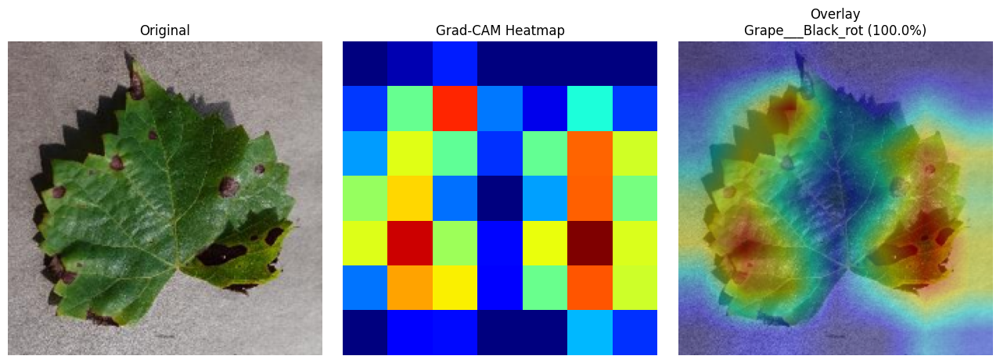

  Grape___Black_rot                        → predicted: Grape___Black_rot (100.0%)


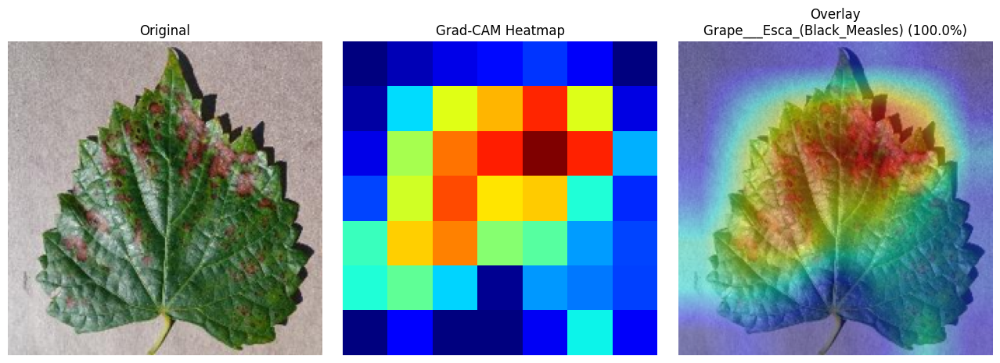

  Grape___Esca_(Black_Measles)             → predicted: Grape___Esca_(Black_Measles) (100.0%)

✅ CELL 14 complete — Grad-CAM overlays saved to /content/drive/MyDrive/major project dataset/2026_07_23_06_46/gradcam
   Use show_gradcam(image_path, gradcam, CLASS_NAMES) for any uploaded image.


In [40]:
# ── CELL 14: Grad-CAM ─────────────────────────────────────────────────────────
import cv2

class GradCAM:
    '''Gradient-weighted Class Activation Mapping for the trained model.'''
    def __init__(self, model, layer_name="top_conv"):
        self.model = model
        self.layer_name = layer_name
        self.grad_model = Model(
            inputs=model.inputs,
            outputs=[model.get_layer(layer_name).output, model.output],
        )

    def compute_heatmap(self, img_batch, class_idx=None):
        with tf.GradientTape() as tape:
            conv_outputs, predictions = self.grad_model(img_batch)
            if class_idx is None:
                class_idx = tf.argmax(predictions[0])
            class_score = predictions[:, class_idx]

        grads = tape.gradient(class_score, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.nn.relu(heatmap)
        heatmap = (heatmap - tf.reduce_min(heatmap)) / (
            tf.reduce_max(heatmap) - tf.reduce_min(heatmap) + 1e-8
        )
        return heatmap.numpy(), predictions.numpy()[0]

    def overlay(self, heatmap, original_img_uint8, alpha=0.4):
        H, W = original_img_uint8.shape[:2]
        heatmap_resized = cv2.resize(heatmap, (W, H))
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
        return cv2.addWeighted(original_img_uint8, 1 - alpha, heatmap_color, alpha, 0)

gradcam = GradCAM(model, layer_name="top_conv")

def show_gradcam(image_path, gradcam, class_names, img_size=IMG_SIZE, save_path=None):
    orig_img = np.array(Image.open(image_path).convert("RGB").resize((img_size, img_size)))
    img_batch = preprocess_input(np.expand_dims(orig_img.astype("float32"), axis=0))

    heatmap, preds = gradcam.compute_heatmap(img_batch)
    pred_idx = int(np.argmax(preds))
    confidence = float(preds[pred_idx])
    overlaid = gradcam.overlay(heatmap, orig_img)

    fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
    axes[0].imshow(orig_img); axes[0].set_title("Original"); axes[0].axis("off")
    axes[1].imshow(heatmap, cmap="jet"); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis("off")
    axes[2].imshow(overlaid)
    axes[2].set_title(f"Overlay\n{class_names[pred_idx]} ({confidence:.1%})")
    axes[2].axis("off")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=130)
    plt.show()
    return class_names[pred_idx], confidence

print("Running Grad-CAM on one sample per class (first 6 classes shown)...")
print("Check: does activation (red/yellow) land on the LESION, or on the BACKGROUND?")
print("Background activation indicates a shortcut-learning failure mode.\n")

for cls in CLASS_NAMES[:6]:
    cls_dir = VAL_DIR / cls
    sample_imgs = [f for f in cls_dir.iterdir() if f.suffix.lower() in VALID_EXTS]
    if not sample_imgs:
        continue
    img_path = np.random.RandomState(SEED).choice(sample_imgs)
    save_path = RUN_DIR / "gradcam" / f"gradcam_{cls}.png"
    pred, conf = show_gradcam(img_path, gradcam, CLASS_NAMES, save_path=save_path)
    print(f"  {cls:<40} → predicted: {pred} ({conf:.1%})")

print(f"\n✅ CELL 14 complete — Grad-CAM overlays saved to {RUN_DIR / 'gradcam'}")
print("   Use show_gradcam(image_path, gradcam, CLASS_NAMES) for any uploaded image.")


## CELL 15 — Confidence-Thresholded Inference

**Purpose.** A prediction returned with 40% confidence on a blurry or
ambiguous field photo is worse than no prediction at all — it can lead a
farmer to apply the wrong treatment with false confidence. Rather than always
forcing a top-1 label, this cell adds a threshold below which the system
returns `"Unknown"` and asks for a clearer photo instead.

`CONFIDENCE_THRESHOLD = 0.55` (set in CELL 1's `CONFIG`) is a deliberately
conservative default: low enough to avoid rejecting most correctly-classified
real photos, high enough to catch genuinely ambiguous cases. It is exposed as
a single configurable constant so it can be tuned against a held-out
real-world photo set later, without touching any other code.


In [41]:
# ── CELL 15: Confidence-Thresholded Prediction ───────────────────────────────
def predict_with_confidence_gate(image_path_or_array, model, class_names,
                                  img_size=IMG_SIZE, confidence_threshold=CONFIG["CONFIDENCE_THRESHOLD"]):
    '''Wraps predict_single_image with an 'Unknown' fallback below threshold.'''
    result = predict_single_image(image_path_or_array, model, class_names, img_size=img_size, show=False)

    if result["confidence"] < confidence_threshold:
        return {
            "status": "uncertain",
            "message": (
                f"Confidence too low ({result['confidence']:.1%} < "
                f"{confidence_threshold:.0%}). Please retake the photo with better "
                f"lighting and a clearer, closer view of the leaf."
            ),
            "top_prediction": result["predicted_class"],
            "confidence": result["confidence"],
            "top5": result["top5"],
        }

    return {
        "status": "confident",
        "predicted_class": result["predicted_class"],
        "confidence": result["confidence"],
        "top5": result["top5"],
        "message": f"{result['predicted_class']} ({result['confidence']:.1%} confidence)",
    }

# ── Demonstrate on a handful of validation images ─────────────────────────────
print(f"Confidence threshold: {CONFIG['CONFIDENCE_THRESHOLD']:.0%}\n")
for p in np.random.RandomState(SEED + 1).choice(VAL_FILE_PATHS, 5, replace=False):
    r = predict_with_confidence_gate(p, model, CLASS_NAMES)
    icon = "✅" if r["status"] == "confident" else "⚠️ "
    print(f"{icon} {Path(p).name:<45} → {r['message']}")

print("\n✅ CELL 15 complete — use predict_with_confidence_gate(...) as the")
print("   production-facing inference entrypoint (used by CELL 17 below).")


Confidence threshold: 55%

✅ 66cac7fb-a88e-495f-ac2c-86bd5acb5276___YLCV_NREC 2357.JPG → Tomato___Tomato_Yellow_Leaf_Curl_Virus (100.0% confidence)
✅ 6578c88a-fd14-450b-8e75-c94571decf83___GHLB2 Leaf 8849.JPG → Tomato___Late_blight (100.0% confidence)
✅ 815de166-0707-4508-883f-25150e9be9a1___YLCV_GCREC 2551.JPG → Tomato___Tomato_Yellow_Leaf_Curl_Virus (73.4% confidence)
✅ cd7835bc-5278-4005-81ec-9186d3237527___Crnl_L.Mold 6901.JPG → Tomato___Leaf_Mold (71.4% confidence)
✅ 1006c73b-19f8-4771-9fe5-3fc4908e8da3___RS_HL 0557.JPG → Tomato___healthy (99.6% confidence)

✅ CELL 15 complete — use predict_with_confidence_gate(...) as the
   production-facing inference entrypoint (used by CELL 17 below).


✅ Model reloaded and RUN_DIR fixed: /content/drive/MyDrive/major project dataset/2026_07_23_06_09


## CELL 16 — Model Export (Keras, SavedModel, TFLite, Label Map)

**Purpose.** Package the trained model for every downstream consumer:

- **`.keras`** — native Keras format, for continued work in this notebook or
  another Python/TensorFlow environment.
- **SavedModel** — TensorFlow's standard serving format, for TF-Serving or
  further conversion.
- **TFLite (dynamic-range quantized)** — the format RaithaMitra's mobile app
  will actually load. Quantization to int8 weights (float activations) cuts
  model size roughly 4× with minimal accuracy loss, which matters directly
  for rural users on limited-storage, mid-range Android devices with
  unreliable connectivity — the model must run fully on-device.
- **`label_map.json`** — the index→class-name mapping (already written in
  CELL 6, re-confirmed here), required by any inference code that consumes
  the exported model outside this notebook.

We also verify that TFLite and Keras predictions agree on a sample image, to
catch quantization-induced prediction drift before deployment.


In [42]:
# ── CELL 16: Model Export ──────────────────────────────────────────────────────
# ── SavedModel ─────────────────────────────────────────────────────────────
savedmodel_path = RUN_DIR / "models" / "saved_model"
model.export(str(savedmodel_path))
print(f"SavedModel exported to: {savedmodel_path}")
LABEL_MAP = {i: name for i, name in enumerate(CLASS_NAMES)}
print(LABEL_MAP)

# ── TFLite (dynamic range quantization) ───────────────────────────────────
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

tflite_path = RUN_DIR / "models" / "model.tflite"
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

keras_size_mb  = FINAL_MODEL_PATH.stat().st_size / (1024 ** 2)
tflite_size_mb = tflite_path.stat().st_size / (1024 ** 2)

print(f"\n{'='*45}\n MODEL EXPORT SUMMARY\n{'='*45}")
print(f"  .keras           : {keras_size_mb:.1f} MB")
print(f"  .tflite (quant)  : {tflite_size_mb:.1f} MB")
print(f"  Size reduction   : {keras_size_mb / tflite_size_mb:.1f}×")
print(f"{'='*45}")

# ── Label map (re-saved for completeness) ─────────────────────────────────
with open(RUN_DIR / "models" / "label_map.json", "w") as f:
    json.dump(LABEL_MAP, f, indent=2)

# ── Verify TFLite ↔ Keras prediction agreement on a sample image ──────────
interpreter = tf.lite.Interpreter(model_path=str(tflite_path))
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

test_img_path ="/content/drive/MyDrive/major project dataset/val/Corn_(maize)___healthy/068794e5-0a99-405f-bbb9-1f954e11942d___R.S_HL 7909 copy 2.jpg"
test_img = np.array(Image.open(test_img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype="float32")
test_batch = preprocess_input(np.expand_dims(test_img, axis=0)).astype(np.float32)

interpreter.set_tensor(input_details[0]["index"], test_batch)
interpreter.invoke()
tflite_pred = CLASS_NAMES[int(np.argmax(interpreter.get_tensor(output_details[0]["index"])[0]))]
keras_pred  = CLASS_NAMES[int(np.argmax(model.predict(test_batch, verbose=0)[0]))]

print(f"\nTFLite prediction : {tflite_pred}")
print(f"Keras prediction  : {keras_pred}")
print(f"Match             : {'✅ YES' if tflite_pred == keras_pred else '⚠️ NO — inspect quantization'}")

print(f"\n✅ CELL 16 complete — all export artifacts saved under {RUN_DIR / 'models'}")


Saved artifact at '/content/drive/MyDrive/major project dataset/2026_07_23_06_46/models/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_image')
Output Type:
  TensorSpec(shape=(None, 21), dtype=tf.float32, name=None)
Captures:
  138694055204560: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138694055209744: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138694306241744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306250000: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306239056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306246160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306246736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306247312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138694306247696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13

## CELL 17 — Standalone Inference Utility (Independent of Training State)

**Purpose.** Everything above assumes `model`, `CLASS_NAMES`, etc. are already
in memory from this training run. This cell is different: it is a **self-
contained** loader that reconstructs everything it needs from disk — the
saved `.keras` model and `label_map.json` — so it can be copied into a
separate script or notebook (e.g. the RaithaMitra backend) and run
independently of this training session, after a Colab restart, or on another
machine entirely.

It bundles prediction, confidence gating, and Grad-CAM into one function,
matching the shape of output the RaithaMitra Kannada TTS diagnosis pipeline
is expected to consume (`predicted_class`, `confidence`, `status`, and an
overlay image for on-screen display).


Reloading inference pipeline from saved artifacts (simulating a fresh session)...

Status      : confident
Diagnosis   : Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot (79.9% confidence)
Top-5       : [('Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', '79.9%'), ('Corn_(maize)___Northern_Leaf_Blight', '20.1%'), ('Tomato___Late_blight', '0.0%'), ('Corn_(maize)___Common_rust_', '0.0%'), ('Potato___Late_blight', '0.0%')]


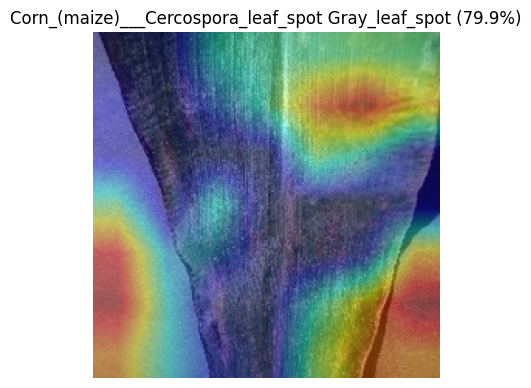


✅ CELL 17 complete — RaithaMitra can call diagnose(image, model, class_names,
   gradcam, confidence_threshold=...) using ONLY the files saved under /content/drive/MyDrive/major project dataset/2026_07_23_06_46.


In [43]:
# ── CELL 17: Standalone Inference Utility ────────────────────────────────────
def load_inference_pipeline(model_path, label_map_path, img_size=224):
    '''
    Rebuilds a full inference pipeline (model + labels + Grad-CAM) purely from
    disk artifacts. Safe to call in a fresh Python session with no other state.
    '''
    loaded_model = tf.keras.models.load_model(str(model_path))
    with open(label_map_path) as f:
        label_map = {int(k): v for k, v in json.load(f).items()}
    class_names_local = [label_map[i] for i in range(len(label_map))]
    gradcam_local = GradCAM(loaded_model, layer_name="top_conv")
    return loaded_model, class_names_local, gradcam_local


def diagnose(image_path_or_array, model, class_names, gradcam,
             img_size=224, confidence_threshold=0.55, with_gradcam=True):
    '''
    End-to-end diagnosis for RaithaMitra: preprocess → predict → confidence
    gate → (optional) Grad-CAM overlay. Returns a dict ready to hand to a
    Kannada TTS / UI layer.
    '''
    if isinstance(image_path_or_array, (str, Path)):
        orig_img = np.array(Image.open(image_path_or_array).convert("RGB").resize((img_size, img_size)))
    else:
        orig_img = np.array(Image.fromarray(np.uint8(image_path_or_array)).convert("RGB").resize((img_size, img_size)))

    img_batch = preprocess_input(np.expand_dims(orig_img.astype("float32"), axis=0))
    preds = model.predict(img_batch, verbose=0)[0]
    top_idx = int(np.argmax(preds))
    confidence = float(preds[top_idx])

    top5_idx = np.argsort(preds)[-5:][::-1]
    top5 = [{"class": class_names[i], "confidence": float(preds[i])} for i in top5_idx]

    result = {
        "status": "confident" if confidence >= confidence_threshold else "uncertain",
        "predicted_class": class_names[top_idx],
        "confidence": confidence,
        "top5": top5,
    }

    if result["status"] == "uncertain":
        result["message"] = (
            f"Confidence too low ({confidence:.1%}). Please retake the photo "
            f"with better lighting and a closer, clearer view of the leaf."
        )
    else:
        result["message"] = f"{class_names[top_idx]} ({confidence:.1%} confidence)"

    if with_gradcam:
        heatmap, _ = gradcam.compute_heatmap(img_batch, class_idx=top_idx)
        result["gradcam_overlay"] = gradcam.overlay(heatmap, orig_img)

    return result


# ── Self-test: reload everything purely from disk and run one diagnosis ─────
print("Reloading inference pipeline from saved artifacts (simulating a fresh session)...\n")
loaded_model, loaded_class_names, loaded_gradcam = load_inference_pipeline(
    FINAL_MODEL_PATH, RUN_DIR / "models" / "label_map.json", img_size=IMG_SIZE,
)

test_result = diagnose(VAL_FILE_PATHS[0], loaded_model, loaded_class_names, loaded_gradcam,
                        img_size=IMG_SIZE, confidence_threshold=CONFIG["CONFIDENCE_THRESHOLD"])

print(f"Status      : {test_result['status']}")
print(f"Diagnosis   : {test_result['message']}")
top5_display = [(t["class"], f"{t['confidence']:.1%}") for t in test_result["top5"]]
print(f"Top-5       : {top5_display}")

plt.figure(figsize=(4.5, 4.5))
plt.imshow(test_result["gradcam_overlay"])
plt.title(f"{test_result['predicted_class']} ({test_result['confidence']:.1%})")
plt.axis("off")
plt.show()

print(f"\n✅ CELL 17 complete — RaithaMitra can call diagnose(image, model, class_names,")
print(f"   gradcam, confidence_threshold=...) using ONLY the files saved under {RUN_DIR}.")


## Run Summary

This cell prints a final summary of the run and where every artifact lives —
useful to paste directly into a project report or viva slide.


In [44]:
# ── Final Summary ─────────────────────────────────────────────────────────────
print("=" * 60)
print(" RAITHAMITRA — EFFICIENTNET-B0 PIPELINE COMPLETE")
print("=" * 60)
print(f"  Run ID              : {RUN_ID}")
print(f"  Classes             : {NUM_CLASSES}")
print(f"  Final Val Accuracy  : {EVAL_SUMMARY['top1_accuracy']:.4f}")
print(f"  Final Val Top-5     : {EVAL_SUMMARY['top5_accuracy']:.4f}")
print(f"  Final Macro F1      : {EVAL_SUMMARY['macro_f1']:.4f}")
print(f"  Final Weighted F1   : {EVAL_SUMMARY['weighted_f1']:.4f}")
print()
print(f"  All artifacts saved under: {RUN_DIR.resolve()}")
print(f"    models/    → best_phase1.keras, best_phase2.keras, final_model.keras,")
print(f"                 saved_model/, model.tflite, label_map.json")
print(f"    logs/      → training_log_phase{{1,2}}.csv, tensorboard_phase{{1,2}}/")
print(f"    plots/     → class_distribution, augmentation_preview, training curves,")
print(f"                 misclassified_samples")
print(f"    gradcam/   → per-class Grad-CAM overlays")
print(f"    metrics/   → history_phase{{1,2}}.json, eval_summary.json,")
print(f"                 per_class_accuracy.json, label_map.json")
print(f"    confusion_matrix/       → confusion_matrix.png, confusion_matrix_raw.npy")
print(f"    classification_report/  → report.txt, report.json")
print(f"    saved_predictions/      → batch_predictions_demo.csv")
print("=" * 60)


 RAITHAMITRA — EFFICIENTNET-B0 PIPELINE COMPLETE
  Run ID              : 2026_07_23_06_46
  Classes             : 21
  Final Val Accuracy  : 0.9534
  Final Val Top-5     : 0.9996
  Final Macro F1      : 0.9499
  Final Weighted F1   : 0.9534

  All artifacts saved under: /content/drive/.shortcut-targets-by-id/1wXnAkRlKQTQdKKjw6Bqw9TLW80H60gGR/dataset/2026_07_23_06_46
    models/    → best_phase1.keras, best_phase2.keras, final_model.keras,
                 saved_model/, model.tflite, label_map.json
    logs/      → training_log_phase{1,2}.csv, tensorboard_phase{1,2}/
    plots/     → class_distribution, augmentation_preview, training curves,
                 misclassified_samples
    gradcam/   → per-class Grad-CAM overlays
    metrics/   → history_phase{1,2}.json, eval_summary.json,
                 per_class_accuracy.json, label_map.json
    confusion_matrix/       → confusion_matrix.png, confusion_matrix_raw.npy
    classification_report/  → report.txt, report.json
    saved_predicti